In [ ]:
!pip -q install transformers accelerate timm
!pip -q install opencv-python pillow matplotlib

In [ ]:
from transformers import AutoImageProcessor
from transformers import SegformerForSemanticSegmentation

processor = AutoImageProcessor.from_pretrained(
    "nvidia/segformer-b2-finetuned-ade-512-512"
)

model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b2-finetuned-ade-512-512"
)

print("SegFormer Loaded Successfully!")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:138: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
  warnings.warn(f"\nError while fetching `HF_TOKEN` secret value from your vault: '{str(e)}'.")


preprocessor_config.json:   0%|          | 0.00/271 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/6.88k [00:00<?, ?B/s]

pytorch_model.bin: reconstructing file:   0%|          |  0.00B /  110MB            

pytorch_model.bin: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/380 [00:00<?, ?it/s]

SegFormer Loaded Successfully!


In [ ]:
print(processor)
print(model)

SegformerImageProcessor {
  "do_normalize": true,
  "do_reduce_labels": false,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "SegformerImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "reduce_labels": true,
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 512,
    "width": 512
  }
}

SegformerForSemanticSegmentation(
  (segformer): SegformerModel(
    (stages): ModuleList(
      (0): SegformerStage(
        (patch_embeddings): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
        (blocks): ModuleList(
          (0): SegformerLayer(
            (layernorm_before): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            (attention): SegformerAttention(
              (q_proj): Linear(in_feat

model.safetensors: reconstructing file:   0%|          |  0.00B /  110MB            

model.safetensors: downloading bytes:           |  0.00B            

Saving floor-tiles-ideas-for-living-room.jpg to floor-tiles-ideas-for-living-room.jpg
Original Size: (700, 500)


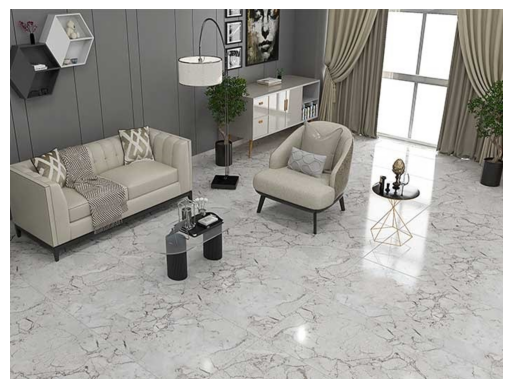

In [ ]:
from PIL import Image
from google.colab import files
import matplotlib.pyplot as plt

uploaded = files.upload()

image_path = list(uploaded.keys())[0]

original_image = Image.open(image_path).convert("RGB")

print("Original Size:", original_image.size)

# Resize for inference
image = original_image.resize((1024, 768))

plt.imshow(image)
plt.axis("off")
plt.show()

In [ ]:
import torch

inputs = processor(images=image, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)

segmentation = processor.post_process_semantic_segmentation(
    outputs,
    target_sizes=[image.size[::-1]]
)[0]

print(segmentation.shape)

torch.Size([768, 1024])


In [ ]:
for idx, label in model.config.id2label.items():
    if "floor" in label.lower():
        print(idx, label)

3 floor


In [ ]:
FLOOR_ID = 3

floor_mask = (segmentation == FLOOR_ID)

print("Floor Mask Shape:", floor_mask.shape)
print("Floor Pixels:", floor_mask.sum())

Floor Mask Shape: torch.Size([768, 1024])
Floor Pixels: tensor(389104)


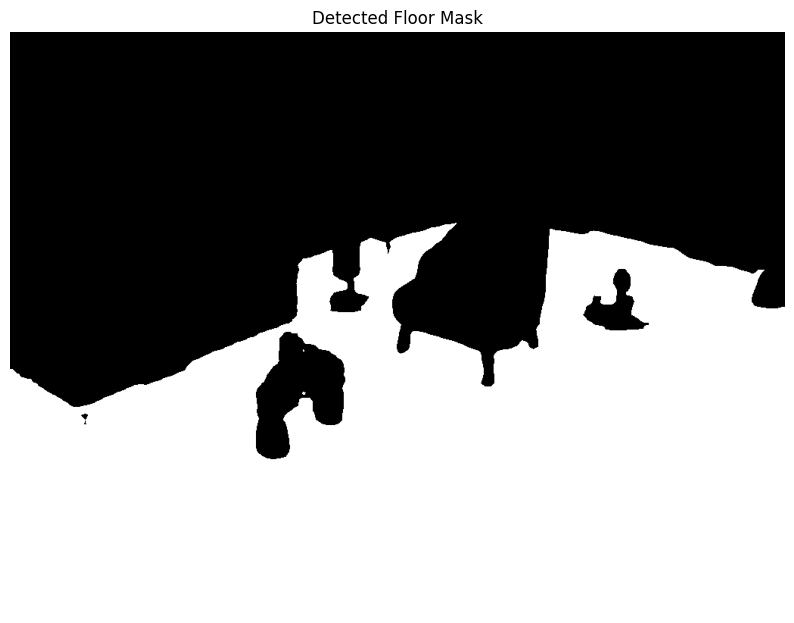

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,8))
plt.imshow(floor_mask.cpu().numpy(), cmap="gray")
plt.title("Detected Floor Mask")
plt.axis("off")
plt.show()

In [ ]:
import cv2
import numpy as np

mask = floor_mask.cpu().numpy().astype(np.uint8)

mask = cv2.resize(
    mask,
    original_image.size,
    interpolation=cv2.INTER_NEAREST
)

floor_mask = mask.astype(bool)

print(floor_mask.shape)

(500, 700)


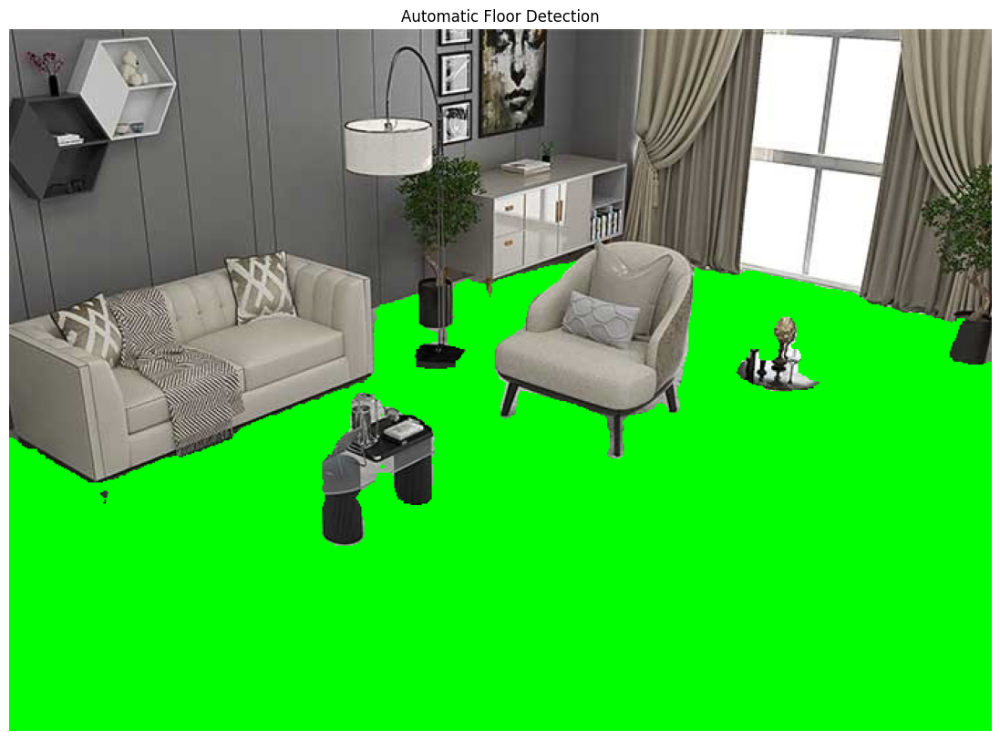

In [ ]:
img = np.array(original_image)

overlay = img.copy()

overlay[floor_mask] = [0,255,0]

plt.figure(figsize=(15,10))
plt.imshow(overlay)
plt.title("Automatic Floor Detection")
plt.axis("off")
plt.show()

### Automatic Wall Detection
Here we define the codes to detect and overlay the walls in the room using the same SegFormer model.

In [ ]:
# Find the label ID for 'wall' in the model's configuration
for idx, label in model.config.id2label.items():
    if "wall" in label.lower():
        print(idx, label)

In [ ]:
# Extract the wall mask using the Wall Label ID (0)
WALL_ID = 0
wall_mask = (segmentation == WALL_ID)

print("Wall Mask Shape:", wall_mask.shape)
print("Wall Pixels:", wall_mask.sum())

In [ ]:
# Display the detected wall mask in grayscale
import matplotlib.pyplot as plt

plt.figure(figsize=(10,8))
plt.imshow(wall_mask.cpu().numpy(), cmap="gray")
plt.title("Detected Wall Mask")
plt.axis("off")
plt.show()

In [ ]:
# Resize the wall mask to match the original image size
w_mask = wall_mask.cpu().numpy().astype(np.uint8)
w_mask = cv2.resize(
    w_mask,
    original_image.size,
    interpolation=cv2.INTER_NEAREST
)
wall_mask_resized = w_mask.astype(bool)
print(wall_mask_resized.shape)

In [ ]:
# Overlay the wall mask (using red color) on top of the original image
img = np.array(original_image)
overlay_wall = img.copy()
overlay_wall[wall_mask_resized] = [255, 0, 0]  # Red color

plt.figure(figsize=(15,10))
plt.imshow(overlay_wall)
plt.title("Automatic Wall Detection")
plt.axis("off")
plt.show()

Saving anaterate-template-3097484_1920.jpg to anaterate-template-3097484_1920.jpg


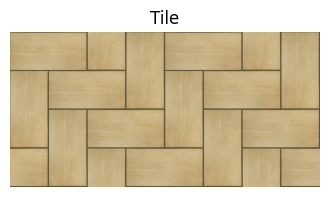

In [ ]:
from google.colab import files
from PIL import Image
import matplotlib.pyplot as plt

uploaded = files.upload()

tile_path = list(uploaded.keys())[0]

tile = Image.open(tile_path).convert("RGB")

plt.figure(figsize=(4,4))
plt.imshow(tile)
plt.title("Tile")
plt.axis("off")
plt.show()

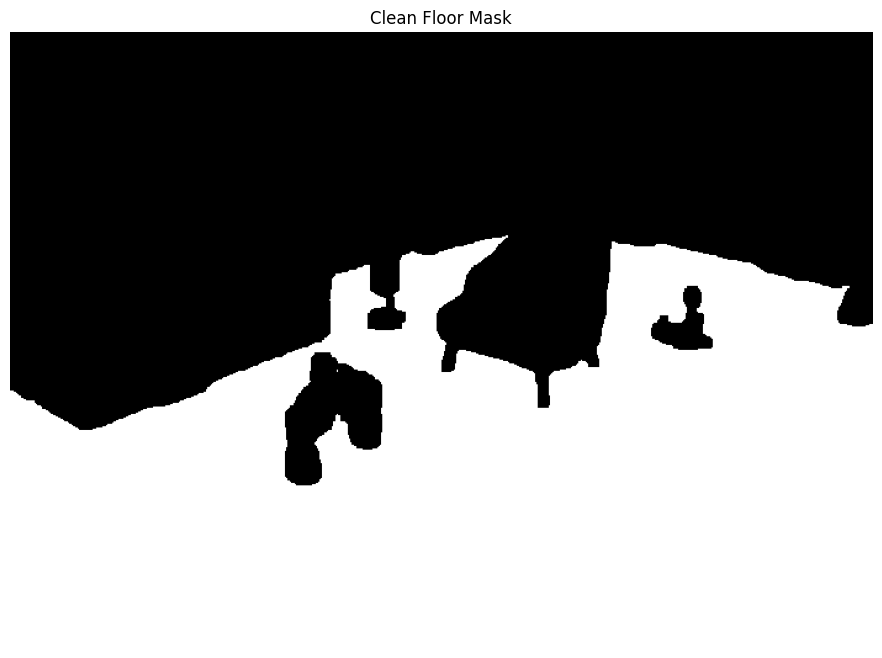

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Convert boolean mask to uint8
mask = floor_mask.astype(np.uint8) * 255

# Remove tiny holes
kernel = np.ones((7,7), np.uint8)

mask = cv2.morphologyEx(
    mask,
    cv2.MORPH_CLOSE,
    kernel
)

plt.figure(figsize=(12,8))
plt.imshow(mask, cmap='gray')
plt.title("Clean Floor Mask")
plt.axis("off")
plt.show()

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ----------------------------------------------------
# Use the ORIGINAL uploaded image
# ----------------------------------------------------

room_image = np.array(original_image)

print("Room image type:", type(room_image))
print("Room image shape:", room_image.shape)

Room image type: <class 'numpy.ndarray'>
Room image shape: (500, 700, 3)


In [ ]:
H, W = room_image.shape[:2]

floor_mask_full = cv2.resize(
    floor_mask.astype(np.uint8),
    (W, H),
    interpolation=cv2.INTER_NEAREST
).astype(bool)

print("Original image:", room_image.shape)
print("SegFormer mask:", floor_mask.shape)
print("Full resolution mask:", floor_mask_full.shape)
print("Floor pixels:", floor_mask_full.sum())

Original image: (500, 700, 3)
SegFormer mask: (500, 700)
Full resolution mask: (500, 700)
Floor pixels: 172782


In [ ]:
mask = floor_mask_full.astype(np.uint8) * 255

kernel = np.ones((25, 25), np.uint8)

mask = cv2.morphologyEx(
    mask,
    cv2.MORPH_CLOSE,
    kernel
)

num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
    mask,
    connectivity=8
)

largest_label = 1 + np.argmax(
    stats[1:, cv2.CC_STAT_AREA]
)

clean_mask = (
    labels == largest_label
).astype(np.uint8) * 255

print("Clean floor pixels:", np.count_nonzero(clean_mask))

Clean floor pixels: 177399


In [ ]:
contours, _ = cv2.findContours(
    clean_mask,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_NONE
)

largest_contour = max(
    contours,
    key=cv2.contourArea
)

print(
    "Largest contour area:",
    cv2.contourArea(largest_contour)
)

Largest contour area: 180430.0


In [ ]:
hull = cv2.convexHull(largest_contour)

print("Contour points:", len(largest_contour))
print("Hull points:", len(hull))

Contour points: 2200
Hull points: 12


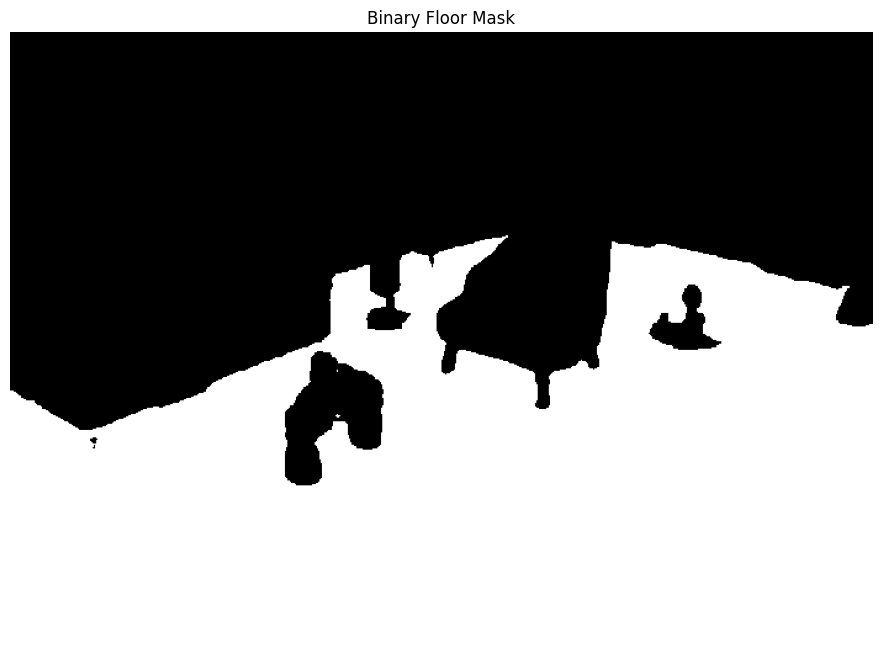

In [ ]:
mask = floor_mask.astype(np.uint8) * 255

plt.figure(figsize=(12,8))
plt.imshow(mask, cmap="gray")
plt.title("Binary Floor Mask")
plt.axis("off")
plt.show()

(np.float64(-0.5), np.float64(699.5), np.float64(499.5), np.float64(-0.5))

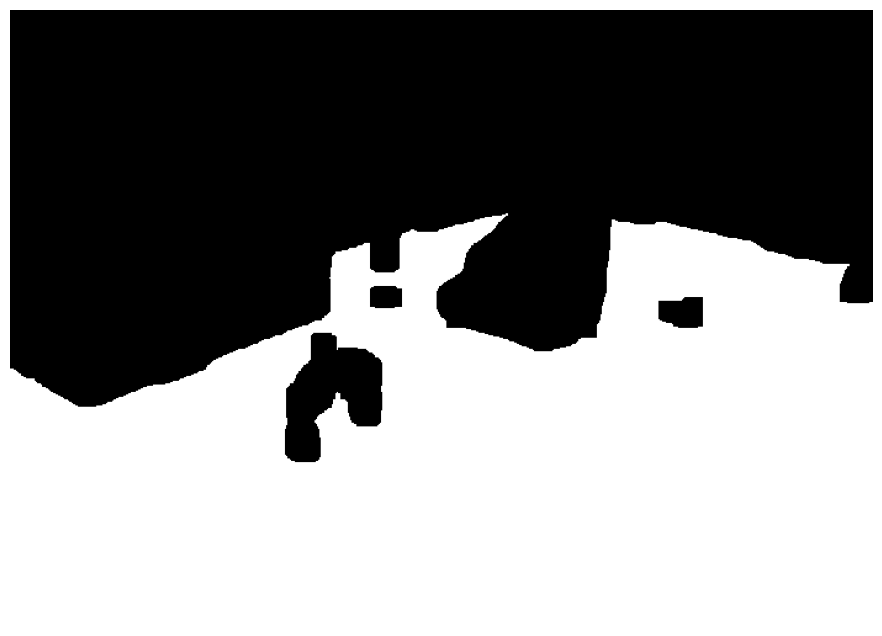

In [ ]:
kernel = np.ones((15,15), np.uint8)

clean = cv2.morphologyEx(
    mask,
    cv2.MORPH_CLOSE,
    kernel
)

plt.figure(figsize=(12,8))
plt.imshow(clean, cmap='gray')
plt.axis("off")

In [ ]:
!pip -q install timm
!git clone https://github.com/DepthAnything/Depth-Anything-V2.git
%cd Depth-Anything-V2
!pip -q install -r requirements.txt

Cloning into 'Depth-Anything-V2'...
remote: Enumerating objects: 146, done.
remote: Total 146 (delta 0), reused 0 (delta 0), pack-reused 146 (from 1)
Receiving objects: 100% (146/146), 45.18 MiB | 21.97 MiB/s, done.
Resolving deltas: 100% (45/45), done.
/content/Depth-Anything-V2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.5/101.5 kB 5.3 MB/s eta 0:00:00


In [ ]:
!mkdir checkpoints

!wget -O checkpoints/depth_anything_v2_vits.pth \
https://huggingface.co/depth-anything/Depth-Anything-V2-Small/resolve/main/depth_anything_v2_vits.pth

--2026-08-11 21:21:56--  https://huggingface.co/depth-anything/Depth-Anything-V2-Small/resolve/main/depth_anything_v2_vits.pth
Resolving huggingface.co (huggingface.co)... 18.164.174.17, 18.164.174.118, 18.164.174.23, ...
Connecting to huggingface.co (huggingface.co)|18.164.174.17|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://us.gcp.cdn.hf.co/xet-bridge-us/666b17aaed1ed0f9bf42823e/01950a0198f6ece4acfd924dbc91f9f6bed4b614a222d64ad3c516ba39447464?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27depth_anything_v2_vits.pth%3B+filename%3D%22depth_anything_v2_vits.pth%22%3B&user_id=public&X-Xet-Cas-Uid=public&Expires=1786486916&Policy=eyJTdGF0ZW1lbnQiOlt7IlJlc291cmNlIjoiaHR0cHM6Ly91cy5nY3AuY2RuLmhmLmNvL3hldC1icmlkZ2UtdXMvNjY2YjE3YWFlZDFlZDBmOWJmNDI4MjNlLzAxOTUwYTAxOThmNmVjZTRhY2ZkOTI0ZGJjOTFmOWY2YmVkNGI2MTRhMjIyZDY0YWQzYzUxNmJhMzk0NDc0NjRcXD9yZXNwb25zZS1jb250ZW50LWRpc3Bvc2l0aW9uPSomdXNlcl9pZD1wdWJsaWMmWC1YZXQtQ2FzLVVpZD1wdWJsaWMiLCJDb25ka

In [ ]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt

from depth_anything_v2.dpt import DepthAnythingV2

In [ ]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

model = DepthAnythingV2(
    encoder='vits',
    features=64,
    out_channels=[48,96,192,384]
)

model.load_state_dict(
    torch.load(
        "checkpoints/depth_anything_v2_vits.pth",
        map_location=DEVICE
    )
)

model = model.to(DEVICE).eval()

print("Depth Anything V2 Loaded!")

Depth Anything V2 Loaded!


In [ ]:
import numpy as np

image = np.array(original_image)

depth = model.infer_image(image)

print(depth.shape)

(500, 700)


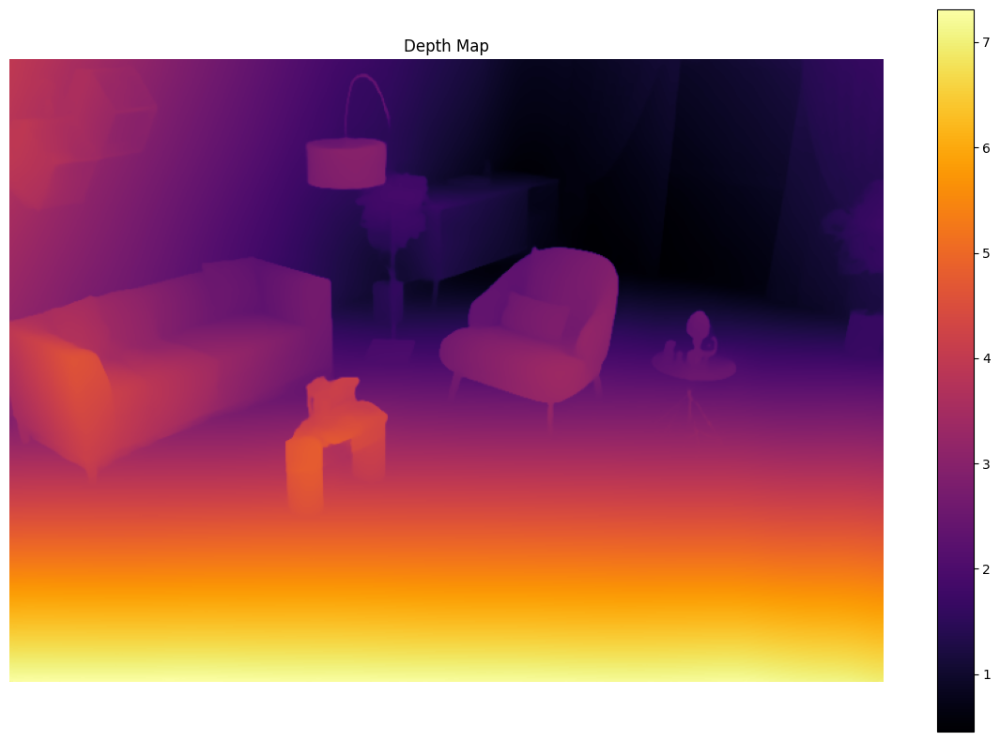

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15,10))
plt.imshow(depth, cmap="inferno")
plt.colorbar()
plt.title("Depth Map")
plt.axis("off")
plt.show()

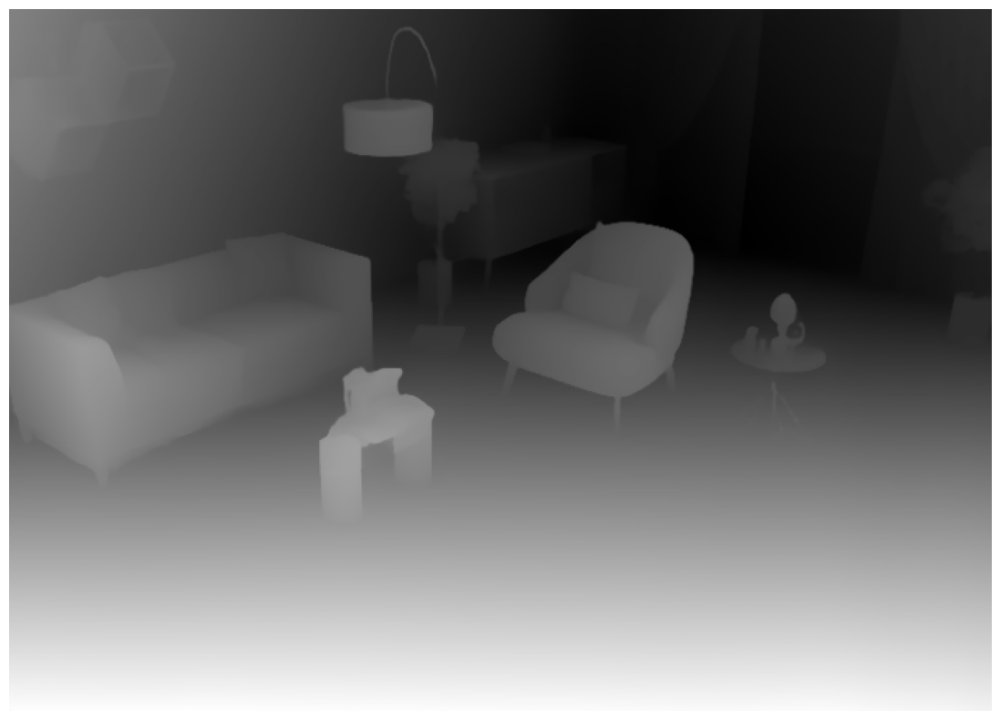

In [ ]:
depth_norm = cv2.normalize(
    depth,
    None,
    0,
    255,
    cv2.NORM_MINMAX
).astype("uint8")

plt.figure(figsize=(15,10))
plt.imshow(depth_norm, cmap="gray")
plt.axis("off")
plt.show()

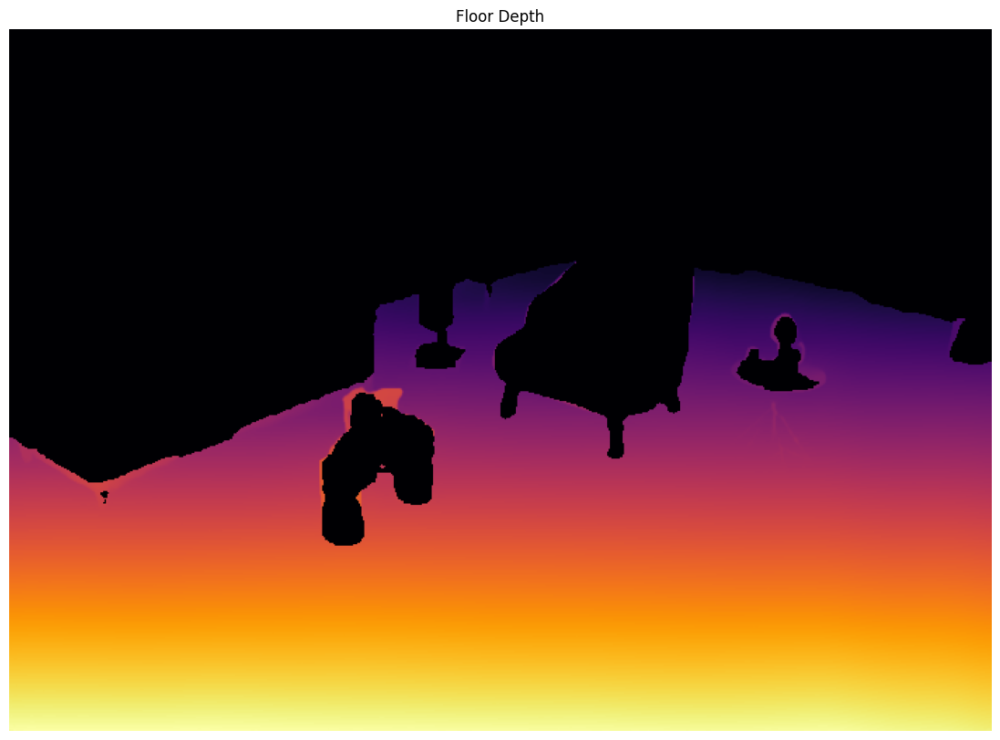

In [ ]:
floor_depth = depth.copy()

floor_depth[~floor_mask] = 0

plt.figure(figsize=(15,10))
plt.imshow(floor_depth, cmap="inferno")
plt.title("Floor Depth")
plt.axis("off")
plt.show()

In [ ]:
import numpy as np

# Floor pixel coordinates
ys, xs = np.where(floor_mask)

# Relative depth values
zs = depth[ys, xs]

# Create Nx3 point cloud
points = np.column_stack((xs, ys, zs))

print("Number of floor points:", len(points))
print(points[:5])

Number of floor points: 172782
[[402.         165.           0.61933374]
 [403.         165.           0.83739263]
 [399.         166.           0.62306887]
 [400.         166.           0.62515533]
 [401.         166.           0.61581606]]


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Convert boolean mask to uint8
mask = (floor_mask.astype(np.uint8)) * 255

# Remove small holes
kernel = np.ones((15,15), np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

# Find contours
contours, _ = cv2.findContours(
    mask,
    cv2.RETR_EXTERNAL,

    cv2.CHAIN_APPROX_NONE
)

largest = max(contours, key=cv2.contourArea)

print("Largest contour area:", cv2.contourArea(largest))

Largest contour area: 179553.0


Vertices: 9


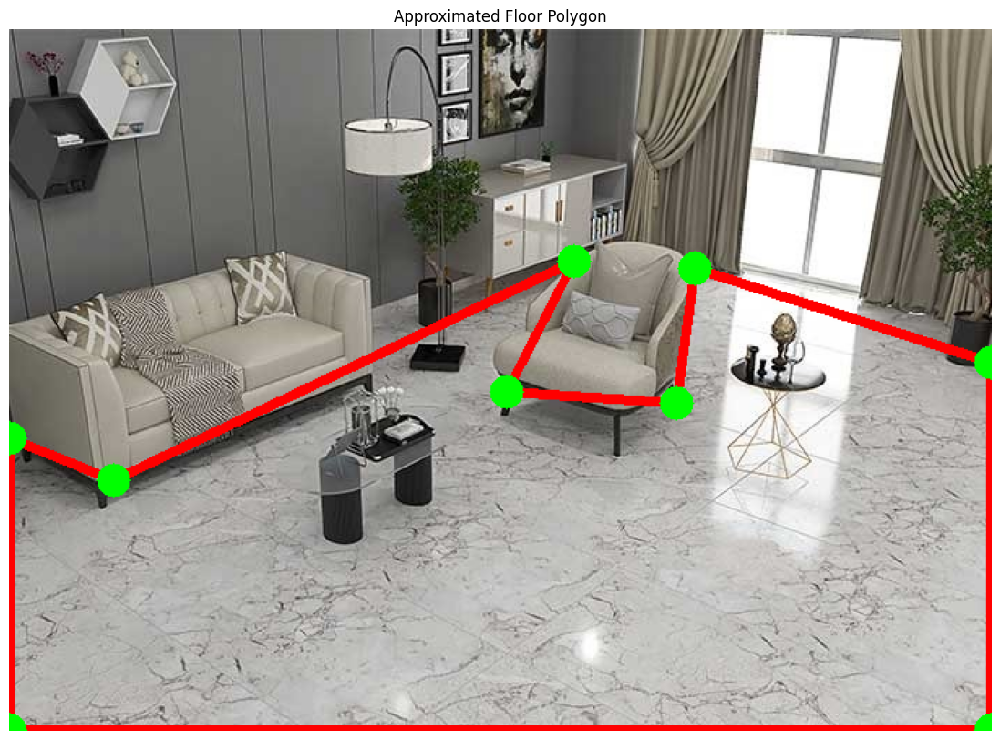

In [ ]:
epsilon = 0.02 * cv2.arcLength(largest, True)

approx = cv2.approxPolyDP(
    largest,
    epsilon,
    True
)

print("Vertices:", len(approx))

img = image.copy()

cv2.drawContours(img, [approx], -1, (255,0,0), 5)

for p in approx:
    x, y = p[0]
    cv2.circle(img, (x, y), 12, (0,255,0), -1)

plt.figure(figsize=(15,10))
plt.imshow(img)
plt.title("Approximated Floor Polygon")
plt.axis("off")
plt.show()

In [ ]:
contours, _ = cv2.findContours(
    clean_mask,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_NONE
)

largest_contour = max(
    contours,
    key=cv2.contourArea
)

print(
    "Largest contour area:",
    cv2.contourArea(largest_contour)
)

Largest contour area: 180430.0


In [ ]:
hull = cv2.convexHull(largest_contour)

print("Contour points:", len(largest_contour))
print("Hull points:", len(hull))

Contour points: 2200
Hull points: 12


3D floor-point reconstruction

In [ ]:
import numpy as np
import cv2

# -------------------------------------------------------
# 3D FLOOR POINT CLOUD
# -------------------------------------------------------

H, W = room_image.shape[:2]

# Floor pixels
ys, xs = np.where(floor_mask_full)

# Depth at floor pixels
zs = depth[ys, xs].astype(np.float32)

# -------------------------------------------------------
# Approximate camera intrinsics
# -------------------------------------------------------

# Assume focal length approximately equal to image width
f = W

cx = W / 2.0
cy = H / 2.0

# -------------------------------------------------------
# Convert image pixels + depth -> camera coordinates
# -------------------------------------------------------

X = (xs.astype(np.float32) - cx) * zs / f
Y = (ys.astype(np.float32) - cy) * zs / f
Z = zs

# Nx3 point cloud
floor_points_3d = np.column_stack((X, Y, Z))

print("3D floor points:", floor_points_3d.shape)

print("\nFirst 5 points:")
print(floor_points_3d[:5])

print("\nX range:", X.min(), X.max())
print("Y range:", Y.min(), Y.max())
print("Z range:", Z.min(), Z.max())

3D floor points: (172782, 3)

First 5 points:
[[ 0.04600765 -0.07520481  0.61933374]
 [ 0.06340259 -0.10168339  0.8373926 ]
 [ 0.04361482 -0.07476826  0.62306887]
 [ 0.04465395 -0.07501864  0.6251553 ]
 [ 0.0448666  -0.07389793  0.61581606]]

X range: -3.6397722 3.4854007
Y range: -0.2660484 2.6009064
Z range: 0.4932983 7.311785


In [ ]:
import numpy as np
from sklearn.linear_model import RANSACRegressor, LinearRegression

# -------------------------------------------------------
# 3D FLOOR PLANE FITTING
# -------------------------------------------------------

points_3d = floor_points_3d

# X,Y coordinates
XY = points_3d[:, :2]

# Z/depth
Z = points_3d[:, 2]

# -------------------------------------------------------
# Sample points
# 4.9 million points is unnecessarily large for RANSAC
# -------------------------------------------------------

MAX_POINTS = 100000

if len(points_3d) > MAX_POINTS:

    rng = np.random.default_rng(42)

    indices = rng.choice(
        len(points_3d),
        MAX_POINTS,
        replace=False
    )

    sample_points = points_3d[indices]

else:

    sample_points = points_3d


X_sample = sample_points[:, :2]
Z_sample = sample_points[:, 2]

print("Points used for RANSAC:", len(sample_points))


# -------------------------------------------------------
# Fit plane:
#
# Z = A*X + B*Y + C
# -------------------------------------------------------

ransac_plane = RANSACRegressor(
    estimator=LinearRegression(),
    residual_threshold=0.03,
    max_trials=100,
    min_samples=3,
    random_state=42
)

ransac_plane.fit(
    X_sample,
    Z_sample
)


# -------------------------------------------------------
# Plane coefficients
# -------------------------------------------------------

A, B = ransac_plane.estimator_.coef_
C = ransac_plane.estimator_.intercept_

print("\nFloor Plane:")
print(
    f"Z = {A:.6f} X + "
    f"{B:.6f} Y + "
    f"{C:.6f}"
)

print(
    "\nPlane fitting completed successfully."
)

Points used for RANSAC: 100000

Floor Plane:
Z = -0.011688 X + 1.441354 Y + 3.655107

Plane fitting completed successfully.


In [ ]:
# -------------------------------------------------------
# Plane normal
#
# Z = A X + B Y + C
#
# Rearranged:
# A X + B Y - Z + C = 0
#
# Normal = (A, B, -1)
# -------------------------------------------------------

normal = np.array([
    A,
    B,
    -1.0
], dtype=np.float64)

normal = normal / np.linalg.norm(normal)

print("Floor plane normal:")
print(normal)

print("Normal magnitude:", np.linalg.norm(normal))

Floor plane normal:
[-0.00666259  0.82160273 -0.57002155]
Normal magnitude: 0.9999999999999999


In [ ]:
# -------------------------------------------------------
# Evaluate RANSAC inliers
# -------------------------------------------------------

inlier_mask = ransac_plane.inlier_mask_

inlier_count = np.count_nonzero(inlier_mask)
total_count = len(inlier_mask)

inlier_percentage = (
    100.0 * inlier_count / total_count
)

print("RANSAC inliers:", inlier_count)
print("Total sampled:", total_count)
print(
    f"Inlier percentage: "
    f"{inlier_percentage:.2f}%"
)

RANSAC inliers: 21701
Total sampled: 100000
Inlier percentage: 21.70%


Total sampled points: 100000
RANSAC inliers: 21701


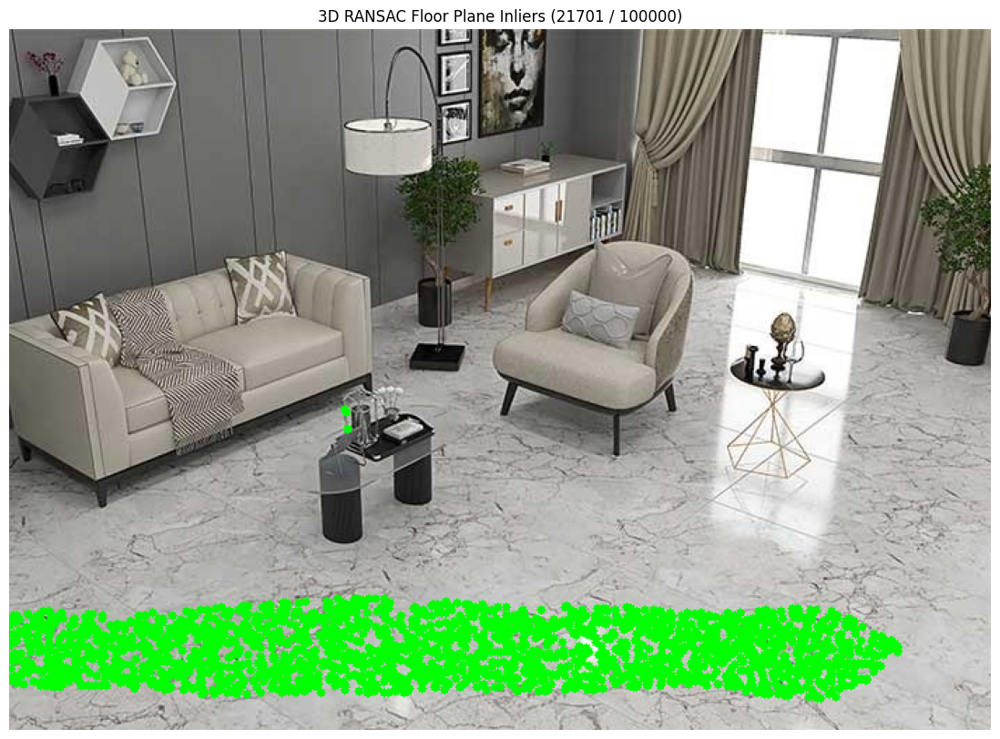

In [ ]:
# -------------------------------------------------------
# VISUALIZE 3D RANSAC FLOOR-PLANE INLIERS
# -------------------------------------------------------

import numpy as np
import cv2
import matplotlib.pyplot as plt

# We sampled 100,000 points for RANSAC.
# Recreate the exact same sample using the same seed.

MAX_POINTS = 100000

rng = np.random.default_rng(42)

if len(floor_points_3d) > MAX_POINTS:

    indices = rng.choice(
        len(floor_points_3d),
        MAX_POINTS,
        replace=False
    )

else:

    indices = np.arange(len(floor_points_3d))


# Original pixel coordinates corresponding to the 3D points
ys, xs = np.where(floor_mask_full)

sample_x = xs[indices]
sample_y = ys[indices]

# RANSAC inliers
inlier_x = sample_x[inlier_mask]
inlier_y = sample_y[inlier_mask]

print("Total sampled points:", len(sample_x))
print("RANSAC inliers:", len(inlier_x))

# -------------------------------------------------------
# Draw inliers
# -------------------------------------------------------

inlier_view = room_image.copy()

# Draw every 10th point for speed/readability
for x, y in zip(
    inlier_x[::10],
    inlier_y[::10]
):

    cv2.circle(
        inlier_view,
        (int(x), int(y)),
        3,
        (0, 255, 0),
        -1
    )

plt.figure(figsize=(18, 10))

plt.imshow(inlier_view)

plt.title(
    f"3D RANSAC Floor Plane Inliers "
    f"({len(inlier_x)} / {len(sample_x)})"
)

plt.axis("off")

plt.show()

In [ ]:
# -------------------------------------------------------
# STEP 3B
# Derive floor-plane quadrilateral from RANSAC plane
# -------------------------------------------------------

import numpy as np
import cv2
import matplotlib.pyplot as plt

# -------------------------------------------------------
# 1. Recover the exact sampled points used by RANSAC
# -------------------------------------------------------

MAX_POINTS = 100000

rng = np.random.default_rng(42)

if len(floor_points_3d) > MAX_POINTS:

    sample_indices = rng.choice(
        len(floor_points_3d),
        MAX_POINTS,
        replace=False
    )

else:

    sample_indices = np.arange(len(floor_points_3d))


sample_points_3d = floor_points_3d[sample_indices]

# Keep only RANSAC inliers
inlier_points_3d = sample_points_3d[inlier_mask]

print("RANSAC inlier 3D points:", inlier_points_3d.shape)

RANSAC inlier 3D points: (21701, 3)


In [ ]:
# -------------------------------------------------------
# 2. Create 2D coordinates ON the estimated floor plane
# -------------------------------------------------------

# Plane normal from previous step
n = np.array([
    A,
    B,
    -1.0
], dtype=np.float64)

n = n / np.linalg.norm(n)

# Choose a reference direction.
# Camera X direction is a useful starting direction.
camera_x = np.array([1.0, 0.0, 0.0])

# Project camera X direction onto the floor plane
u = camera_x - np.dot(camera_x, n) * n

u = u / (
    np.linalg.norm(u) + 1e-8
)

# Second direction on plane
v = np.cross(n, u)

v = v / (
    np.linalg.norm(v) + 1e-8
)

print("Plane normal:")
print(n)

print("\nPlane axis U:")
print(u)

print("\nPlane axis V:")
print(v)

print("\nOrthogonality:")
print("U · V =", np.dot(u, v))
print("U · N =", np.dot(u, n))
print("V · N =", np.dot(v, n))

Plane normal:
[-0.00666259  0.82160273 -0.57002155]

Plane axis U:
[ 0.99997779  0.00547412 -0.0037979 ]

Plane axis V:
[-4.33680869e-19 -5.70034197e-01 -8.21620955e-01]

Orthogonality:
U · V = 1.3297548743531972e-19
U · N = -7.704005700750724e-19
V · N = -2.3250142474718987e-18


In [ ]:
# -------------------------------------------------------
# 3. Convert 3D floor points to coordinates on the plane
# -------------------------------------------------------

# Use the centroid as the plane origin
origin = np.mean(
    inlier_points_3d,
    axis=0
)

relative = (
    inlier_points_3d - origin
)

plane_u = relative @ u
plane_v = relative @ v

plane_points_2d = np.column_stack([
    plane_u,
    plane_v
])

print("Plane coordinates:", plane_points_2d.shape)

print(
    "U range:",
    plane_u.min(),
    plane_u.max()
)

print(
    "V range:",
    plane_v.min(),
    plane_v.max()
)

Plane coordinates: (21701, 2)
U range: -2.961580542538146 2.8011099448964822
V range: -0.8786577908219938 2.9036335308948527


In [ ]:
# -------------------------------------------------------
# 4. Robust floor-plane extent
# -------------------------------------------------------

u_min, u_max = np.percentile(
    plane_u,
    [1, 99]
)

v_min, v_max = np.percentile(
    plane_v,
    [1, 99]
)

print("Plane extent:")
print("U:", u_min, "→", u_max)
print("V:", v_min, "→", v_max)

Plane extent:
U: -2.713418561371668 → 2.680443312465541
V: -0.808296914441082 → 0.7900119778147571


In [ ]:
# -------------------------------------------------------
# 5. Four corners on the estimated 3D floor plane
# -------------------------------------------------------

P1_3d = (
    origin
    + u_min * u
    + v_min * v
)

P2_3d = (
    origin
    + u_max * u
    + v_min * v
)

P3_3d = (
    origin
    + u_max * u
    + v_max * v
)

P4_3d = (
    origin
    + u_min * u
    + v_max * v
)

floor_corners_3d = np.array([
    P1_3d,
    P2_3d,
    P3_3d,
    P4_3d
])

print("3D floor corners:")
print(floor_corners_3d)

3D floor corners:
[[-3.06628489  2.11912071  6.74535376]
 [ 2.32745721  2.14864737  6.72486839]
 [ 2.32745721  1.23755665  5.41166431]
 [-3.06628489  1.20802999  5.43214968]]


In [ ]:
# -------------------------------------------------------
# 6. Project 3D floor corners back to image coordinates
# -------------------------------------------------------

f = W

cx = W / 2.0
cy = H / 2.0

projected_corners = []

for X, Y, Z in floor_corners_3d:

    if Z <= 0:
        print("Warning: corner has invalid depth:", Z)

    x_img = (
        f * X / Z
        + cx
    )

    y_img = (
        f * Y / Z
        + cy
    )

    projected_corners.append([
        x_img,
        y_img
    ])

floor_quad = np.array(
    projected_corners,
    dtype=np.float32
)

print("Projected floor corners:")
print(floor_quad)

Projected floor corners:
[[ 31.79587  469.91205 ]
 [592.26794  473.6554  ]
 [651.0571   410.07822 ]
 [-45.128918 405.66968 ]]


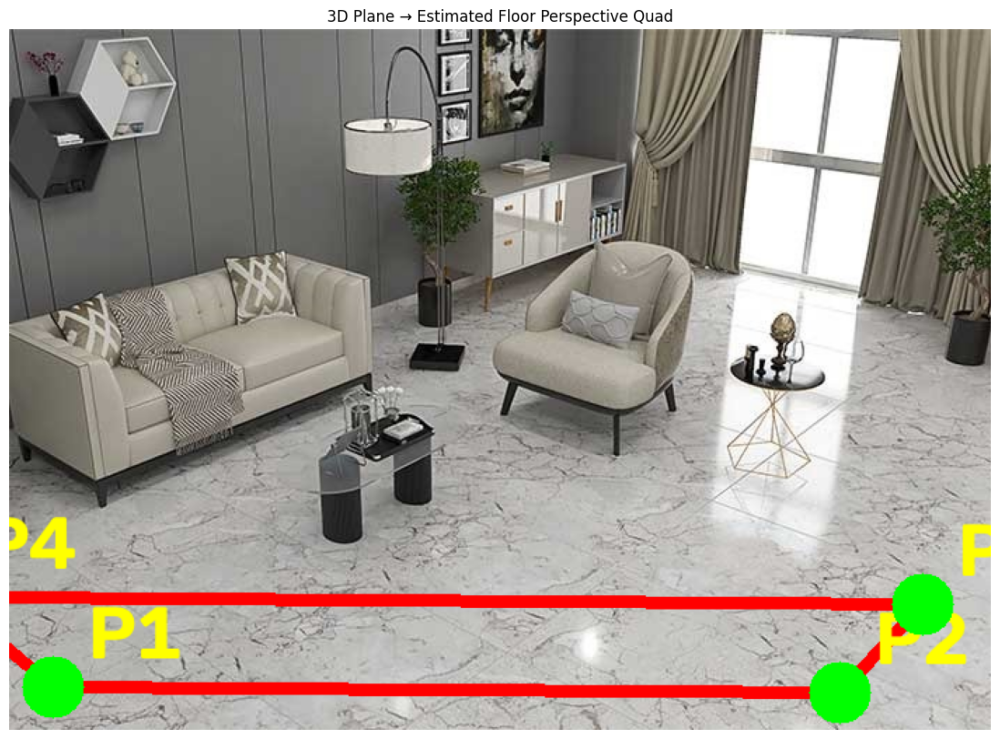

In [ ]:
# -------------------------------------------------------
# 7. VISUALIZE THE ESTIMATED FLOOR QUAD
# -------------------------------------------------------

quad_view = room_image.copy()

# Draw quadrilateral
cv2.polylines(
    quad_view,
    [floor_quad.astype(np.int32)],
    True,
    (255, 0, 0),
    8
)

# Draw corners
for i, (x, y) in enumerate(floor_quad):

    x = int(x)
    y = int(y)

    cv2.circle(
        quad_view,
        (x, y),
        22,
        (0, 255, 0),
        -1
    )

    cv2.putText(
        quad_view,
        f"P{i+1}",
        (x + 25, y - 20),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.8,
        (255, 255, 0),
        5
    )

plt.figure(figsize=(18, 10))

plt.imshow(quad_view)

plt.title(
    "3D Plane → Estimated Floor Perspective Quad"
)

plt.axis("off")

plt.show()

Image: (500, 700, 3)
Floor mask: (500, 700)
Clean floor pixels: 175181
Largest floor component: 175181
Contour points: 2215
Contour area: 179609.5
Detected floor lines: 153
Usable lines: 153
Dominant floorboard angle: -28.25
Strong floorboard lines: 36
Estimated floor vanishing point: [163.05634751 437.37327549]
Floor Y range: 175.0 → 499.0
Estimated far-floor Y: 354
Far boundary: 0.0 369 → 699.0 369
Near boundary: 0.0 499 → 699.0 499
Vanishing-point geometry available.

Candidate quad:
P1: (0.00, 369.00)
P2: (699.00, 369.00)
P3: (699.00, 499.00)
P4: (0.00, 499.00)

Quad area: 90870.0
Image area: 350000
Quad/image ratio: 0.25962857142857143
Corners inside image: 4 / 4


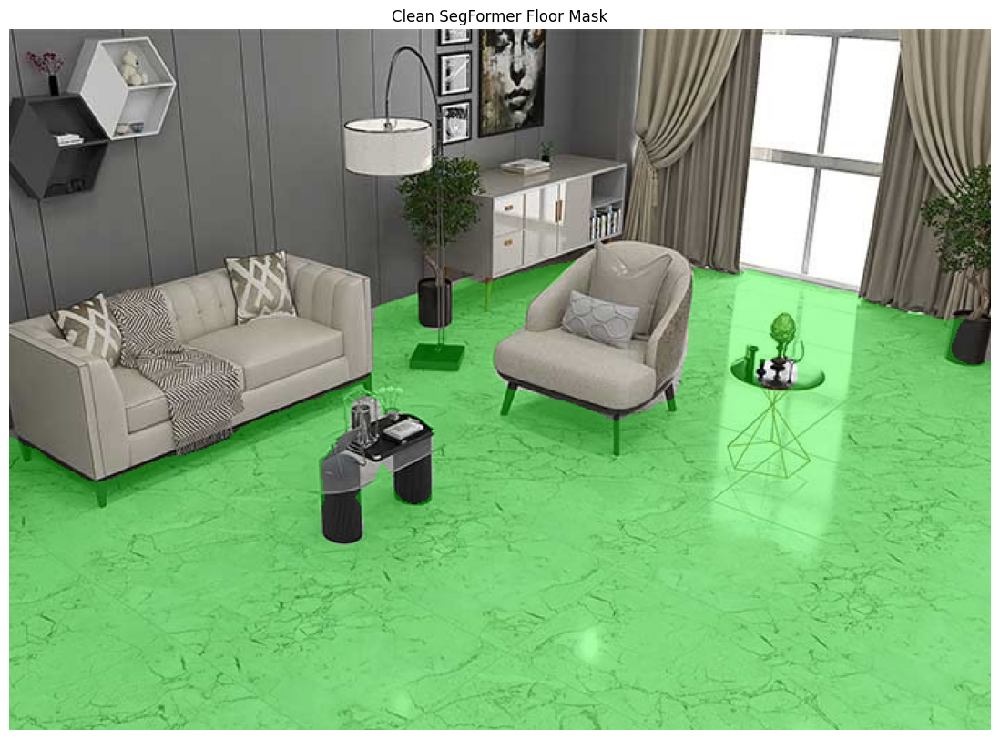

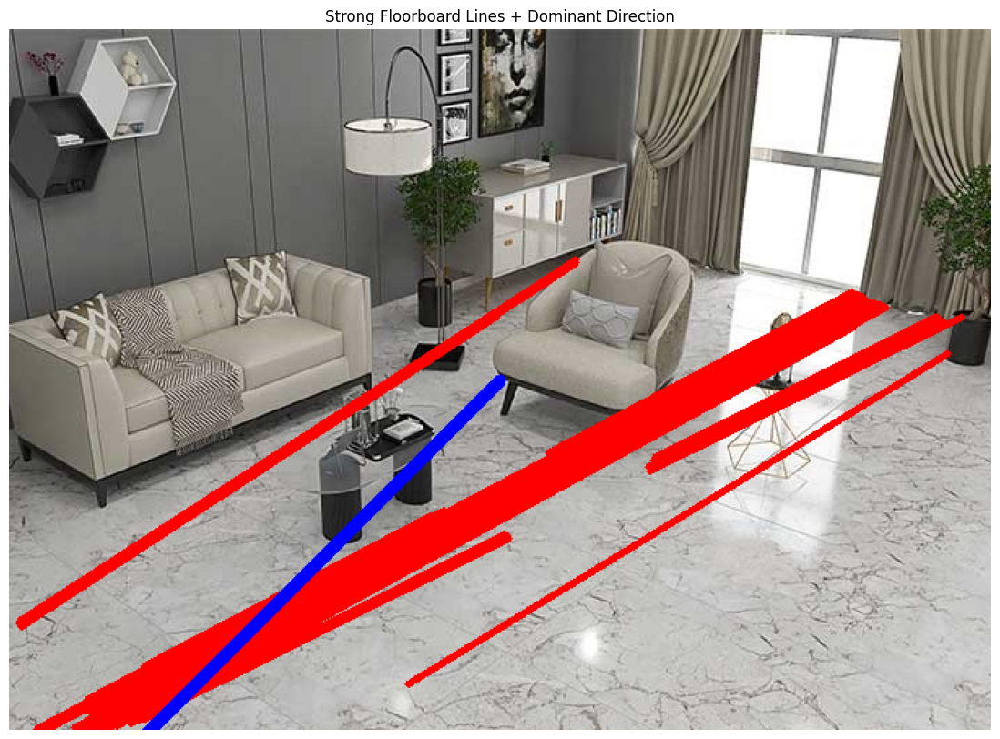

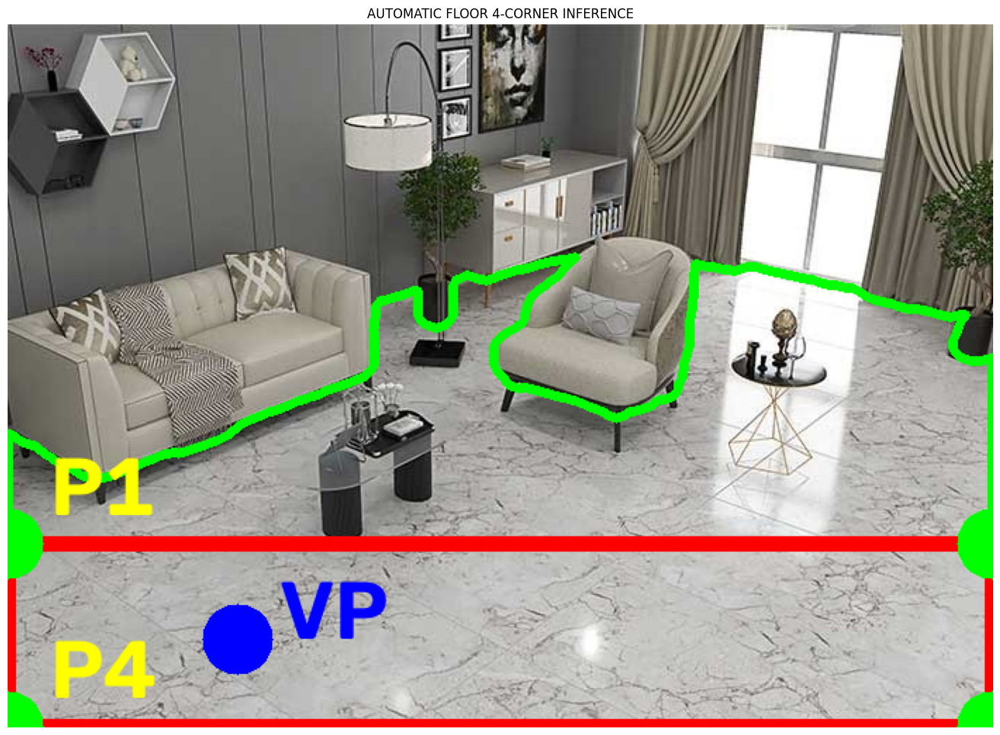



AUTOMATIC GEOMETRY ENGINE COMPLETE
Dominant floor angle: -28.25
Vanishing point: [163.05634751 437.37327549]
Far boundary: 0.0 369 699.0 369
Near boundary: 0.0 499 699.0 499

Final floor_quad:
[[  0. 369.]
 [699. 369.]
 [699. 499.]
 [  0. 499.]]

Corner order:
P1 = far-left
P2 = far-right
P3 = near-right
P4 = near-left

DO NOT RUN HOMOGRAPHY YET.
First verify the blue quadrilateral visually.


In [ ]:
# ============================================================
# ROBUST AUTOMATIC FLOOR GEOMETRY ENGINE
# SegFormer mask -> floor lines -> vanishing point
# -> visible floor boundary -> automatic 4-corner inference
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 0. INPUT CHECK
# ============================================================

if room_image is None:
    raise ValueError("room_image is not available.")

if floor_mask_full is None:
    raise ValueError("floor_mask_full is not available.")

image = room_image.copy()

H, W = image.shape[:2]

print("Image:", image.shape)
print("Floor mask:", floor_mask_full.shape)


# ============================================================
# 1. CLEAN SEGFORMER FLOOR MASK
# ============================================================

mask = (
    floor_mask_full > 0
).astype(np.uint8) * 255

# Close small gaps
close_kernel = cv2.getStructuringElement(
    cv2.MORPH_ELLIPSE,
    (21, 21)
)

mask = cv2.morphologyEx(
    mask,
    cv2.MORPH_CLOSE,
    close_kernel
)

# Fill small holes
fill_kernel = cv2.getStructuringElement(
    cv2.MORPH_ELLIPSE,
    (11, 11)
)

mask = cv2.morphologyEx(
    mask,
    cv2.MORPH_CLOSE,
    fill_kernel
)

print(
    "Clean floor pixels:",
    np.count_nonzero(mask)
)


# ============================================================
# 2. FIND LARGEST FLOOR COMPONENT
# ============================================================

num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
    mask,
    connectivity=8
)

if num_labels <= 1:
    raise RuntimeError("No floor component found.")

largest_label = 1 + np.argmax(
    stats[1:, cv2.CC_STAT_AREA]
)

floor_component = (
    labels == largest_label
).astype(np.uint8) * 255

print(
    "Largest floor component:",
    np.count_nonzero(floor_component)
)


# ============================================================
# 3. FLOOR CONTOUR
# ============================================================

contours, _ = cv2.findContours(
    floor_component,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_NONE
)

if not contours:
    raise RuntimeError("No floor contour found.")

largest_contour = max(
    contours,
    key=cv2.contourArea
)

contour = largest_contour.reshape(
    -1, 2
).astype(np.float32)

print(
    "Contour points:",
    len(contour)
)

print(
    "Contour area:",
    cv2.contourArea(largest_contour)
)


# ============================================================
# 4. FLOOR-REGION EDGE DETECTION
# ============================================================

gray = cv2.cvtColor(
    image,
    cv2.COLOR_RGB2GRAY
)

gray = cv2.GaussianBlur(
    gray,
    (5, 5),
    0
)

edges = cv2.Canny(
    gray,
    40,
    120
)

# Keep edges inside the floor mask
floor_edges = cv2.bitwise_and(
    edges,
    floor_component
)

# Slight dilation helps recover floorboard lines
floor_edges = cv2.dilate(
    floor_edges,
    np.ones((3, 3), np.uint8),
    iterations=1
)


# ============================================================
# 5. HOUGH LINES
# ============================================================

lines = cv2.HoughLinesP(
    floor_edges,
    rho=1,
    theta=np.pi / 1800,
    threshold=100,
    minLineLength=max(
        200,
        int(W * 0.05)
    ),
    maxLineGap=80
)

if lines is None:
    raise RuntimeError(
        "No floor lines detected."
    )

lines = lines.reshape(
    -1,
    4
)

print(
    "Detected floor lines:",
    len(lines)
)


# ============================================================
# 6. LINE REPRESENTATION
# ============================================================

line_data = []

for x1, y1, x2, y2 in lines:

    dx = float(x2 - x1)
    dy = float(y2 - y1)

    length = np.hypot(
        dx,
        dy
    )

    if length < 100:
        continue

    angle = np.degrees(
        np.arctan2(
            dy,
            dx
        )
    )

    # Normalize to [-90, 90]
    while angle > 90:
        angle -= 180

    while angle < -90:
        angle += 180

    line_data.append({
        "p1": np.array(
            [x1, y1],
            dtype=np.float64
        ),
        "p2": np.array(
            [x2, y2],
            dtype=np.float64
        ),
        "length": length,
        "angle": angle
    })


print(
    "Usable lines:",
    len(line_data)
)


# ============================================================
# 7. ANGLE HISTOGRAM
# ============================================================

bins = np.linspace(
    -90,
    90,
    361
)

hist = np.zeros(
    len(bins) - 1,
    dtype=np.float64
)

for line in line_data:

    a = line["angle"]

    idx = np.digitize(
        a,
        bins
    ) - 1

    if 0 <= idx < len(hist):

        # Strong preference for long floorboard lines
        hist[idx] += (
            line["length"] ** 1.5
        )


# Smooth histogram
kernel = np.ones(
    9
) / 9.0

hist_smooth = np.convolve(
    hist,
    kernel,
    mode="same"
)


# ============================================================
# 8. DOMINANT FLOORBOARD ANGLE
# ============================================================

peak_idx = np.argmax(
    hist_smooth
)

dominant_angle = (
    bins[peak_idx]
    + bins[peak_idx + 1]
) / 2

print(
    "Dominant floorboard angle:",
    dominant_angle
)


# ============================================================
# 9. SELECT ONLY STRONG FLOORBOARD LINES
# ============================================================

floorboard_lines = []

for line in line_data:

    angle_difference = abs(
        line["angle"]
        - dominant_angle
    )

    # Handle circular angle distance
    angle_difference = min(
        angle_difference,
        180 - angle_difference
    )

    if angle_difference <= 5:

        floorboard_lines.append(
            line
        )


print(
    "Strong floorboard lines:",
    len(floorboard_lines)
)


# ============================================================
# 10. HOMOGENEOUS LINE
# ============================================================

def segment_to_line(p1, p2):

    p1h = np.array([
        p1[0],
        p1[1],
        1.0
    ])

    p2h = np.array([
        p2[0],
        p2[1],
        1.0
    ])

    return np.cross(
        p1h,
        p2h
    )


# ============================================================
# 11. INTERSECTION
# ============================================================

def line_intersection(l1, l2):

    p = np.cross(
        l1,
        l2
    )

    if abs(p[2]) < 1e-10:
        return None

    p = p / p[2]

    if not np.all(
        np.isfinite(p)
    ):
        return None

    return p[:2]


# ============================================================
# 12. RANSAC-STYLE VANISHING POINT ESTIMATION
# ============================================================

def estimate_vanishing_point(lines):

    if len(lines) < 3:
        return None

    intersections = []
    weights = []

    for i in range(
        len(lines)
    ):

        for j in range(
            i + 1,
            len(lines)
        ):

            a = lines[i]
            b = lines[j]

            l1 = segment_to_line(
                a["p1"],
                a["p2"]
            )

            l2 = segment_to_line(
                b["p1"],
                b["p2"]
            )

            p = line_intersection(
                l1,
                l2
            )

            if p is None:
                continue

            x, y = p

            # Reject absurd intersections
            if abs(x) > W * 20:
                continue

            if abs(y) > H * 20:
                continue

            # Weight by line length
            weight = np.sqrt(
                a["length"]
                * b["length"]
            )

            intersections.append(
                p
            )

            weights.append(
                weight
            )

    if len(intersections) < 5:
        return None

    intersections = np.array(
        intersections
    )

    weights = np.array(
        weights
    )

    # Weighted geometric median approximation
    candidate = np.average(
        intersections,
        axis=0,
        weights=weights
    )

    # Robust refinement:
    # keep intersections near candidate
    distances = np.linalg.norm(
        intersections - candidate,
        axis=1
    )

    threshold = np.percentile(
        distances,
        35
    )

    good = (
        distances <= threshold
    )

    if np.count_nonzero(good) >= 5:

        candidate = np.average(
            intersections[good],
            axis=0,
            weights=weights[good]
        )

    return candidate


vp = estimate_vanishing_point(
    floorboard_lines
)

print(
    "Estimated floor vanishing point:",
    vp
)


# ============================================================
# 13. FLOOR CONTOUR Y-DISTRIBUTION
#
# Determine the visible vertical extent of floor.
# ============================================================

x_contour = contour[:, 0]
y_contour = contour[:, 1]

# Robust limits
y_top = np.percentile(
    y_contour,
    5
)

y_bottom = np.percentile(
    y_contour,
    95
)

print(
    "Floor Y range:",
    y_top,
    "→",
    y_bottom
)


# ============================================================
# 14. FIND THE FAR FLOOR EDGE
#
# Rather than using the entire contour, examine horizontal
# occupancy of the floor mask.
# ============================================================

row_occupancy = np.sum(
    floor_component > 0,
    axis=1
)

# Smooth occupancy
row_occupancy_smooth = cv2.GaussianBlur(
    row_occupancy.astype(np.float32),
    (1, 51),
    0
).flatten()


# Search only upper 70% of image
search_end = int(
    H * 0.75
)

candidate_rows = np.arange(
    0,
    search_end
)

# Ignore tiny floor fragments
min_width = W * 0.15

valid_rows = (
    row_occupancy_smooth[
        candidate_rows
    ] > min_width
)

candidate_rows = candidate_rows[
    valid_rows
]

if len(candidate_rows) == 0:

    far_y = int(
        y_top
    )

else:

    # The lowest valid row before the main floor body
    # is a useful far-boundary estimate.
    far_y = int(
        np.percentile(
            candidate_rows,
            90
        )
    )


print(
    "Estimated far-floor Y:",
    far_y
)


# ============================================================
# 15. GET FLOOR INTERSECTION AT A GIVEN ROW
# ============================================================

def row_floor_intersections(y):

    if y < 0 or y >= H:
        return None

    row = (
        floor_component[y] > 0
    )

    xs = np.where(
        row
    )[0]

    if len(xs) < 20:
        return None

    # Split into contiguous runs
    groups = []

    start = xs[0]
    previous = xs[0]

    for x in xs[1:]:

        if x > previous + 1:

            groups.append(
                (start, previous)
            )

            start = x

        previous = x

    groups.append(
        (start, previous)
    )

    # Keep sufficiently wide floor regions
    groups = [
        g for g in groups
        if (g[1] - g[0]) > W * 0.02
    ]

    if not groups:
        return None

    # Use widest region
    group = max(
        groups,
        key=lambda g: g[1] - g[0]
    )

    return (
        float(group[0]),
        float(group[1])
    )


# ============================================================
# 16. SEARCH FOR A BETTER FAR BOUNDARY
# ============================================================

far_candidates = []

for y in range(
    max(0, far_y - 300),
    min(H, far_y + 301),
    5
):

    result = row_floor_intersections(
        y
    )

    if result is None:
        continue

    left_x, right_x = result

    width = (
        right_x - left_x
    )

    far_candidates.append({
        "y": y,
        "left": left_x,
        "right": right_x,
        "width": width
    })


if far_candidates:

    # Prefer high row with a wide continuous floor region
    far_candidates = sorted(
        far_candidates,
        key=lambda r: (
            -r["width"],
            r["y"]
        )
    )

    far_info = far_candidates[0]

    far_y = far_info["y"]
    far_left = far_info["left"]
    far_right = far_info["right"]

else:

    far_left = 0
    far_right = W - 1


print(
    "Far boundary:",
    far_left,
    far_y,
    "→",
    far_right,
    far_y
)


# ============================================================
# 17. NEAR FLOOR BOUNDARY
#
# If the floor extends to the bottom of the image,
# use the visible image boundary.
# ============================================================

bottom_y = H - 1

bottom_result = row_floor_intersections(
    bottom_y
)

if bottom_result is not None:

    near_left, near_right = bottom_result

else:

    # Fall back to contour extents
    near_left = np.min(
        x_contour[
            y_contour > np.percentile(
                y_contour,
                90
            )
        ]
    )

    near_right = np.max(
        x_contour[
            y_contour > np.percentile(
                y_contour,
                90
            )
        ]
    )


print(
    "Near boundary:",
    near_left,
    bottom_y,
    "→",
    near_right,
    bottom_y
)


# ============================================================
# 18. INITIAL PROJECTIVE QUAD
#
# We deliberately construct:
#
# P1 = far-left
# P2 = far-right
# P3 = near-right
# P4 = near-left
#
# This is a visible-floor quad, not a metric 3D rectangle.
# ============================================================

quad = np.array([
    [far_left, far_y],
    [far_right, far_y],
    [near_right, bottom_y],
    [near_left, bottom_y]
], dtype=np.float32)


# ============================================================
# 19. IMPROVE FAR EDGE USING VANISHING POINT
#
# The far edge should approximately follow the dominant
# floorboard direction.
# ============================================================

if vp is not None:

    # Create line through far-left toward VP
    left_far_line = segment_to_line(
        quad[0],
        vp
    )

    # Create line through far-right toward VP
    right_far_line = segment_to_line(
        quad[1],
        vp
    )

    # These are used only as geometric diagnostics.
    print(
        "Vanishing-point geometry available."
    )


# ============================================================
# 20. QUAD SANITY CHECK
# ============================================================

def polygon_area(points):

    return abs(
        cv2.contourArea(
            points.reshape(-1, 1, 2)
        )
    )


quad_area = polygon_area(
    quad
)

image_area = W * H

area_ratio = (
    quad_area /
    image_area
)

print(
    "\nCandidate quad:"
)

for i, p in enumerate(
    quad
):

    print(
        f"P{i+1}: "
        f"({p[0]:.2f}, {p[1]:.2f})"
    )

print(
    "\nQuad area:",
    quad_area
)

print(
    "Image area:",
    image_area
)

print(
    "Quad/image ratio:",
    area_ratio
)


# ============================================================
# 21. CHECK WHETHER CORNERS ARE INSIDE IMAGE
# ============================================================

inside_count = 0

for p in quad:

    if (
        0 <= p[0] < W
        and
        0 <= p[1] < H
    ):

        inside_count += 1


print(
    "Corners inside image:",
    inside_count,
    "/ 4"
)


# ============================================================
# 22. VISUALIZE FLOOR MASK
# ============================================================

mask_visual = image.copy()

overlay = np.zeros_like(
    image
)

overlay[:, :, 1] = 255

floor_bool = (
    floor_component > 0
)

mask_visual[
    floor_bool
] = cv2.addWeighted(
    mask_visual[floor_bool],
    0.65,
    overlay[floor_bool],
    0.35,
    0
)


plt.figure(
    figsize=(20, 10)
)

plt.imshow(
    mask_visual
)

plt.title(
    "Clean SegFormer Floor Mask"
)

plt.axis("off")

plt.show()


# ============================================================
# 23. VISUALIZE FLOOR LINES
# ============================================================

line_visual = image.copy()

for line in floorboard_lines:

    p1 = tuple(
        line["p1"].astype(int)
    )

    p2 = tuple(
        line["p2"].astype(int)
    )

    cv2.line(
        line_visual,
        p1,
        p2,
        (255, 0, 0),
        4
    )


if vp is not None:

    vx, vy = vp

    if np.isfinite(vx) and np.isfinite(vy):

        # Draw VP if reasonably near
        if (
            abs(vx) < W * 10
            and
            abs(vy) < H * 10
        ):

            dx = vx - W / 2
            dy = vy - H / 2

            length = np.hypot(
                dx,
                dy
            )

            if length > 0:

                dx /= length
                dy /= length

                start = np.array([
                    W / 2,
                    H / 2
                ])

                end = start + np.array([
                    dx,
                    dy
                ]) * max(W, H) * 3

                cv2.line(
                    line_visual,
                    tuple(
                        start.astype(int)
                    ),
                    tuple(
                        end.astype(int)
                    ),
                    (0, 0, 255),
                    8
                )


plt.figure(
    figsize=(20, 10)
)

plt.imshow(
    line_visual
)

plt.title(
    "Strong Floorboard Lines + Dominant Direction"
)

plt.axis("off")

plt.show()


# ============================================================
# 24. FINAL AUTOMATIC QUAD VISUALIZATION
# ============================================================

final_visual = image.copy()

# Floor contour
cv2.polylines(
    final_visual,
    [largest_contour],
    True,
    (0, 255, 0),
    5
)

# Far boundary
cv2.line(
    final_visual,
    (
        int(far_left),
        int(far_y)
    ),
    (
        int(far_right),
        int(far_y)
    ),
    (255, 255, 0),
    8
)

# Near boundary
cv2.line(
    final_visual,
    (
        int(near_left),
        int(bottom_y)
    ),
    (
        int(near_right),
        int(bottom_y)
    ),
    (255, 255, 0),
    8
)

# Quad
cv2.polylines(
    final_visual,
    [quad.astype(np.int32)],
    True,
    (255, 0, 0),
    10
)

# Corners
for i, p in enumerate(
    quad
):

    x = int(
        np.clip(
            p[0],
            0,
            W - 1
        )
    )

    y = int(
        np.clip(
            p[1],
            0,
            H - 1
        )
    )

    cv2.circle(
        final_visual,
        (x, y),
        25,
        (0, 255, 0),
        -1
    )

    cv2.putText(
        final_visual,
        f"P{i+1}",
        (
            x + 30,
            y - 20
        ),
        cv2.FONT_HERSHEY_SIMPLEX,
        2,
        (255, 255, 0),
        6
    )


# VP
if vp is not None:

    vx, vy = vp

    if (
        np.isfinite(vx)
        and
        np.isfinite(vy)
    ):

        if (
            0 <= vx < W
            and
            0 <= vy < H
        ):

            cv2.circle(
                final_visual,
                (
                    int(vx),
                    int(vy)
                ),
                25,
                (0, 0, 255),
                -1
            )

            cv2.putText(
                final_visual,
                "VP",
                (
                    int(vx) + 30,
                    int(vy)
                ),
                cv2.FONT_HERSHEY_SIMPLEX,
                2,
                (0, 0, 255),
                6
            )


plt.figure(
    figsize=(20, 12)
)

plt.imshow(
    final_visual
)

plt.title(
    "AUTOMATIC FLOOR 4-CORNER INFERENCE"
)

plt.axis("off")

plt.show()


# ============================================================
# 25. FINAL OUTPUT VARIABLES
# ============================================================

floor_quad = quad.copy()

print("\n")
print("=" * 65)
print("AUTOMATIC GEOMETRY ENGINE COMPLETE")
print("=" * 65)

print(
    "Dominant floor angle:",
    dominant_angle
)

print(
    "Vanishing point:",
    vp
)

print(
    "Far boundary:",
    far_left,
    far_y,
    far_right,
    far_y
)

print(
    "Near boundary:",
    near_left,
    bottom_y,
    near_right,
    bottom_y
)

print("\nFinal floor_quad:")

print(
    floor_quad
)

print(
    "\nCorner order:"
)

print(
    "P1 = far-left"
)

print(
    "P2 = far-right"
)

print(
    "P3 = near-right"
)

print(
    "P4 = near-left"
)

print(
    "\nDO NOT RUN HOMOGRAPHY YET."
)

print(
    "First verify the blue quadrilateral visually."
)

Room: (500, 700, 3)
Floor mask pixels: 172782

Floor quad:
[[ 300. 3000.]
 [5330. 3000.]
 [5632. 3725.]
 [   0. 3725.]]


Saving floor-tiles-ideas-for-living-room.jpg to floor-tiles-ideas-for-living-room.jpg
Tile image: (500, 700, 3)

Homography:
[[ 2.51625813e+00 -2.50208507e-01  3.00000000e+02]
 [ 0.00000000e+00  2.72591921e-01  3.00000000e+03]
 [ 0.00000000e+00 -8.91486276e-05  1.00000000e+00]]


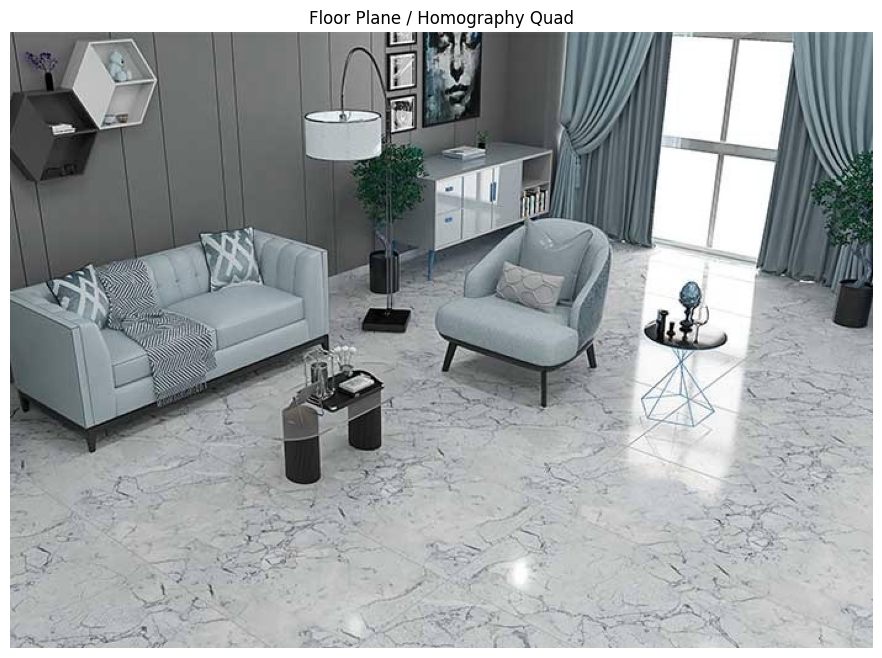

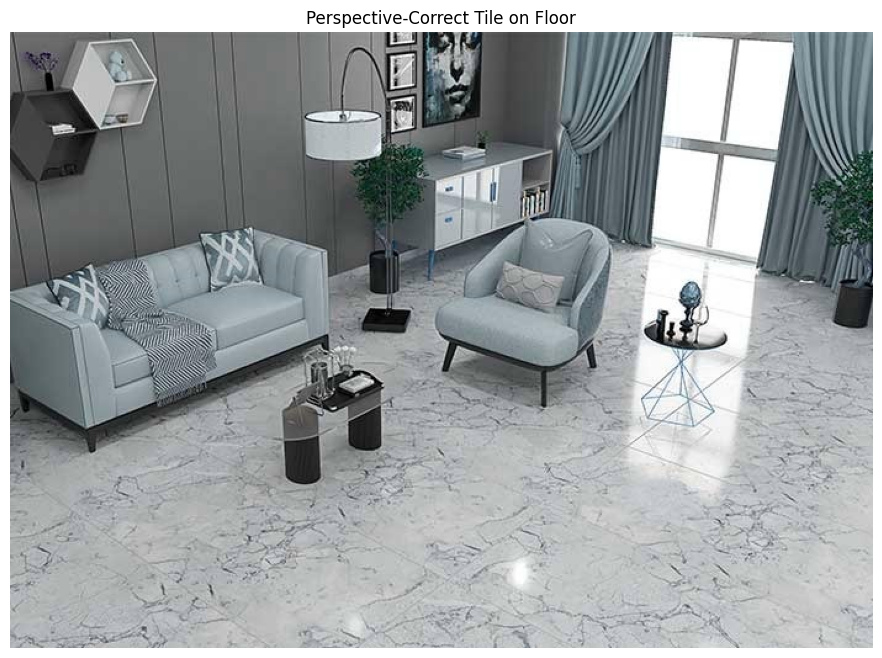

In [ ]:
# ============================================================
# FLOOR TILE HOMOGRAPHY RENDERER
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from google.colab import files

# ------------------------------------------------------------
# 1. ORIGINAL IMAGE
# ------------------------------------------------------------

room = room_image.copy()

H, W = room.shape[:2]

print("Room:", room.shape)


# ------------------------------------------------------------
# 2. FLOOR MASK
# ------------------------------------------------------------

floor_mask = (
    floor_mask_full > 0
).astype(np.uint8) * 255

print(
    "Floor mask pixels:",
    np.count_nonzero(floor_mask)
)


# ------------------------------------------------------------
# 3. FOUR CORNERS OF FLOOR PLANE
#
# IMPORTANT:
# These are the PROJECTIVE corners of the plane,
# NOT necessarily visible physical corners.
#
# Start with these and adjust if necessary.
# ------------------------------------------------------------

floor_quad = np.array([
    [300, 3000],       # P1 - far left
    [5330, 3000],      # P2 - far right
    [5632, 3725],      # P3 - near right
    [0, 3725]          # P4 - near left
], dtype=np.float32)

print("\nFloor quad:")
print(floor_quad)


# ------------------------------------------------------------
# 4. CREATE FLAT TOP-DOWN TILE SURFACE
# ------------------------------------------------------------

plane_width = 2000
plane_height = 1200

# Example tile image
# Change this path to your tile image
uploaded = files.upload()

tile_path = list(uploaded.keys())[0]

tile = cv2.imread(
    tile_path
)

if tile is None:
    raise RuntimeError(
        "Could not load tile image."
    )

print(
    "Tile image:",
    tile.shape
)


# ------------------------------------------------------------
# 5. CREATE REPEATED TILE PATTERN
# ------------------------------------------------------------

tile_h, tile_w = tile.shape[:2]

# Desired number of tiles across
tiles_x = 8
tiles_y = 5

tile_surface = np.zeros(
    (
        plane_height,
        plane_width,
        3
    ),
    dtype=np.uint8
)

cell_w = plane_width // tiles_x
cell_h = plane_height // tiles_y

for row in range(tiles_y):

    for col in range(tiles_x):

        resized_tile = cv2.resize(
            tile,
            (
                cell_w,
                cell_h
            ),
            interpolation=cv2.INTER_AREA
        )

        x1 = col * cell_w
        y1 = row * cell_h

        x2 = min(
            x1 + cell_w,
            plane_width
        )

        y2 = min(
            y1 + cell_h,
            plane_height
        )

        tile_surface[
            y1:y2,
            x1:x2
        ] = resized_tile[
            :y2-y1,
            :x2-x1
        ]


# ------------------------------------------------------------
# 6. SOURCE RECTANGLE
#
# This represents the flat/top-down plane.
# ------------------------------------------------------------

src = np.array([
    [0, 0],
    [plane_width - 1, 0],
    [plane_width - 1, plane_height - 1],
    [0, plane_height - 1]
], dtype=np.float32)


# ------------------------------------------------------------
# 7. HOMOGRAPHY
#
# Flat plane → perspective floor
# ------------------------------------------------------------

H_matrix = cv2.getPerspectiveTransform(
    src,
    floor_quad
)

print("\nHomography:")
print(H_matrix)


# ------------------------------------------------------------
# 8. WARP TILE SURFACE INTO ROOM
# ------------------------------------------------------------

warped_tile = cv2.warpPerspective(
    tile_surface,
    H_matrix,
    (W, H)
)


# ------------------------------------------------------------
# 9. CREATE QUAD MASK
# ------------------------------------------------------------

quad_mask = np.zeros(
    (H, W),
    dtype=np.uint8
)

cv2.fillConvexPoly(
    quad_mask,
    floor_quad.astype(np.int32),
    255
)


# ------------------------------------------------------------
# 10. COMBINE:
#
#     PROJECTIVE QUAD
#             AND
#       SEGFORMER FLOOR
#
# This prevents tiles from appearing on furniture.
# ------------------------------------------------------------

combined_mask = cv2.bitwise_and(
    quad_mask,
    floor_mask
)


# ------------------------------------------------------------
# 11. OPTIONAL SOFT EDGE
# ------------------------------------------------------------

kernel = np.ones(
    (5, 5),
    np.uint8
)

combined_mask = cv2.morphologyEx(
    combined_mask,
    cv2.MORPH_CLOSE,
    kernel
)


# ------------------------------------------------------------
# 12. COMPOSITE TILE WITH ORIGINAL IMAGE
# ------------------------------------------------------------

result = room.copy()

alpha = (
    combined_mask.astype(np.float32)
    / 255.0
)

# Slight transparency so original floor lighting remains visible
alpha *= 0.85

alpha = alpha[:, :, None]

result = (
    warped_tile.astype(np.float32) * alpha
    +
    room.astype(np.float32) * (1 - alpha)
)

result = np.clip(
    result,
    0,
    255
).astype(np.uint8)


# ------------------------------------------------------------
# 13. SHOW FLOOR QUAD
# ------------------------------------------------------------

debug = room.copy()

cv2.polylines(
    debug,
    [
        floor_quad.astype(
            np.int32
        )
    ],
    True,
    (255, 0, 0),
    8
)

for i, p in enumerate(
    floor_quad
):

    x = int(p[0])
    y = int(p[1])

    cv2.circle(
        debug,
        (x, y),
        20,
        (0, 255, 0),
        -1
    )

    cv2.putText(
        debug,
        f"P{i+1}",
        (x + 20, y - 20),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.5,
        (0, 255, 255),
        4
    )


# ------------------------------------------------------------
# 14. DISPLAY
# ------------------------------------------------------------

plt.figure(
    figsize=(20, 8)
)

plt.imshow(
    cv2.cvtColor(
        debug,
        cv2.COLOR_BGR2RGB
    )
)

plt.title(
    "Floor Plane / Homography Quad"
)

plt.axis("off")

plt.show()


plt.figure(
    figsize=(20, 8)
)

plt.imshow(
    cv2.cvtColor(
        result,
        cv2.COLOR_BGR2RGB
    )
)

plt.title(
    "Perspective-Correct Tile on Floor"
)

plt.axis("off")

plt.show()

Image: (500, 700, 3)
Mask : (500, 700)
Floor pixels: 172782
Largest floor pixels: 173899
Contour points: 2225
Contour area: 179490.5
Top-envelope points: 700
Envelope after border filtering: 672
Left envelope: 183
Right envelope: 182

Left fit: -0.21976063850618377 325.81257196118213
Right fit: 0.25999794969996953 35.25539472754405

FINAL FAR BOUNDARY:
y = -0.224080 * x + 323.937

Projected far boundary:
Left : 0 323.9373689497005
Right: 699 167.3055689601815

Floor reaches image bottom.
Near boundary:
6.99 499 → 692.01 499

Candidate floor quad:
P1: (0.00, 323.94)
P2: (699.00, 167.31)
P3: (692.01, 499.00)
P4: (6.99, 499.00)

Quad area: 175340.47457283305
Image area: 350000
Area ratio: 0.5009727844938087

Far-boundary mask support: 0.7633333333333333


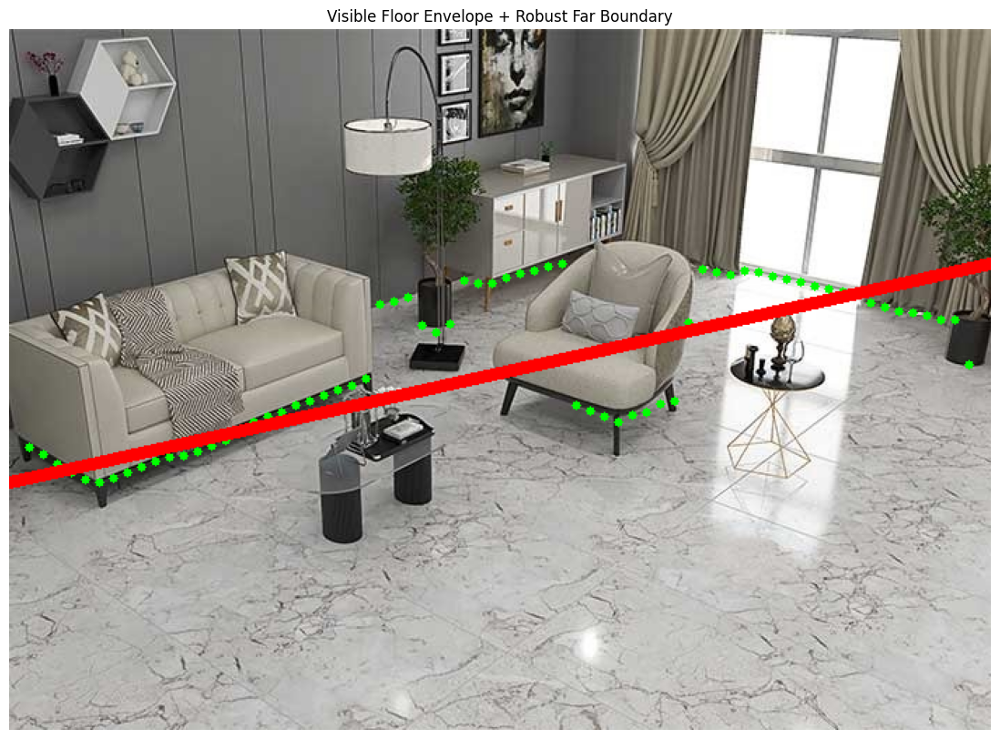

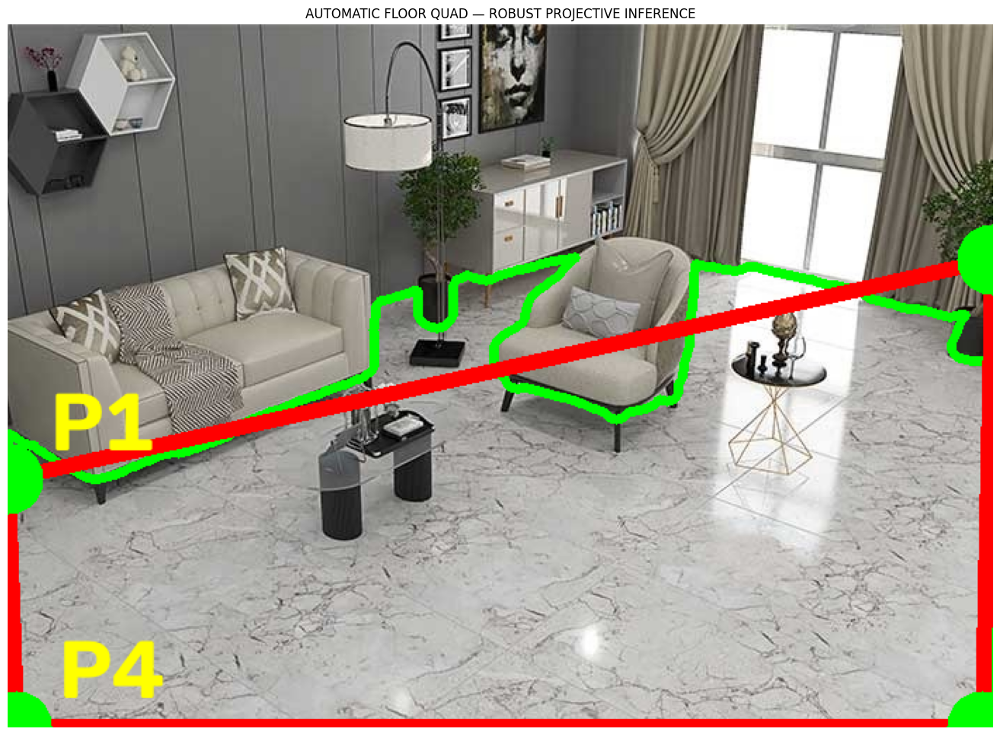



ROBUST FLOOR GEOMETRY RESULT
Far boundary equation: y = -0.224080x + 323.937
Far boundary support: 76.33%
Quad/image area ratio: 0.5010

FLOOR QUAD:
[[  0.      323.93738]
 [699.      167.30557]
 [692.01    499.     ]
 [  6.99    499.     ]]

Corner order:
P1 = far-left
P2 = far-right
P3 = near-right
P4 = near-left

DO NOT RUN HOMOGRAPHY YET.
Verify the blue quadrilateral against the actual wooden floor first.


In [ ]:
# ============================================================
# ROBUST FLOOR QUAD INFERENCE — VERSION 2
#
# Uses:
#   room_image
#   floor_mask_full
#
# Does NOT use:
#   failed plane-consistency mask
#   unreliable floorboard VP
#   single horizontal far_y
#
# Output:
#   floor_quad = [P1, P2, P3, P4]
#
# Order:
#   P1 = far-left
#   P2 = far-right
#   P3 = near-right
#   P4 = near-left
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 1. INPUT
# ============================================================

image = room_image.copy()

H, W = image.shape[:2]

mask = (
    floor_mask_full > 0
).astype(np.uint8)

print("Image:", image.shape)
print("Mask :", mask.shape)

print(
    "Floor pixels:",
    np.count_nonzero(mask)
)


# ============================================================
# 2. CLEAN MASK
# ============================================================

mask_u8 = mask * 255

kernel = cv2.getStructuringElement(
    cv2.MORPH_ELLIPSE,
    (15, 15)
)

clean_mask = cv2.morphologyEx(
    mask_u8,
    cv2.MORPH_CLOSE,
    kernel
)

# Keep largest component
num_labels, labels, stats, centroids = (
    cv2.connectedComponentsWithStats(
        clean_mask,
        connectivity=8
    )
)

if num_labels <= 1:
    raise RuntimeError(
        "No floor component found."
    )

largest_label = (
    1
    + np.argmax(
        stats[1:, cv2.CC_STAT_AREA]
    )
)

clean_mask = (
    labels == largest_label
).astype(np.uint8)

print(
    "Largest floor pixels:",
    np.count_nonzero(clean_mask)
)


# ============================================================
# 3. CONTOUR
# ============================================================

contours, _ = cv2.findContours(
    clean_mask,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_NONE
)

if not contours:
    raise RuntimeError(
        "No floor contour found."
    )

largest_contour = max(
    contours,
    key=cv2.contourArea
)

contour = largest_contour.reshape(
    -1,
    2
).astype(np.float64)

print(
    "Contour points:",
    len(contour)
)

print(
    "Contour area:",
    cv2.contourArea(
        largest_contour
    )
)


# ============================================================
# 4. TOP ENVELOPE
#
# For every x-column:
#
#       first floor pixel
#              ↓
#        upper floor envelope
#
# We DON'T use a single row.
# ============================================================

top_points = []

for x in range(W):

    ys = np.where(
        clean_mask[:, x] > 0
    )[0]

    if len(ys) == 0:
        continue

    y = ys[0]

    top_points.append(
        [x, y]
    )

top_points = np.array(
    top_points,
    dtype=np.float64
)

print(
    "Top-envelope points:",
    len(top_points)
)


# ============================================================
# 5. REMOVE UNRELIABLE EXTREME COLUMNS
#
# Very extreme image borders can contain tripod / wall
# artifacts. Keep a small interior margin.
# ============================================================

margin = int(
    W * 0.02
)

top_points = top_points[
    (top_points[:, 0] >= margin)
    &
    (top_points[:, 0] <= W - margin - 1)
]

print(
    "Envelope after border filtering:",
    len(top_points)
)


# ============================================================
# 6. SPLIT INTO LEFT / RIGHT VISIBLE FLOOR REGIONS
#
# The central floor is heavily occluded by furniture/rug.
#
# Therefore:
#
#       LEFT visible floor       RIGHT visible floor
#              ↓                         ↓
#                 far boundary
# ============================================================

left_limit = W * 0.28
right_limit = W * 0.72

left_env = top_points[
    top_points[:, 0] <= left_limit
]

right_env = top_points[
    top_points[:, 0] >= right_limit
]

print(
    "Left envelope:",
    len(left_env)
)

print(
    "Right envelope:",
    len(right_env)
)


# ============================================================
# 7. ROBUST LINE FIT
#
# We fit:
#
#       y = m*x + b
#
# using RANSAC.
#
# This is much better than forcing y = constant.
# ============================================================

def robust_line_fit(points):

    if len(points) < 20:
        return None

    x = points[:, 0]
    y = points[:, 1]

    best_inliers = None
    best_count = 0
    best_model = None

    rng = np.random.default_rng(42)

    iterations = min(
        3000,
        max(500, len(points) * 2)
    )

    for _ in range(iterations):

        idx = rng.choice(
            len(points),
            2,
            replace=False
        )

        x1, x2 = x[idx]
        y1, y2 = y[idx]

        if abs(x2 - x1) < 1e-6:
            continue

        m = (
            (y2 - y1)
            /
            (x2 - x1)
        )

        b = y1 - m * x1

        predicted = (
            m * x + b
        )

        residual = np.abs(
            y - predicted
        )

        # Pixel tolerance
        inliers = (
            residual < 35
        )

        count = np.count_nonzero(
            inliers
        )

        if count > best_count:

            best_count = count
            best_inliers = inliers
            best_model = (
                m,
                b
            )

    if best_model is None:
        return None

    # Refine using all RANSAC inliers
    m, b = best_model

    x_in = x[
        best_inliers
    ]

    y_in = y[
        best_inliers
    ]

    if len(x_in) >= 2:

        A = np.column_stack([
            x_in,
            np.ones(
                len(x_in)
            )
        ])

        m, b = np.linalg.lstsq(
            A,
            y_in,
            rcond=None
        )[0]

    return {
        "m": m,
        "b": b,
        "inliers": best_inliers,
        "count": best_count
    }


# ============================================================
# 8. FIT LEFT AND RIGHT
# ============================================================

left_fit = robust_line_fit(
    left_env
)

right_fit = robust_line_fit(
    right_env
)

print(
    "\nLeft fit:",
    left_fit["m"] if left_fit else None,
    left_fit["b"] if left_fit else None
)

print(
    "Right fit:",
    right_fit["m"] if right_fit else None,
    right_fit["b"] if right_fit else None
)


# ============================================================
# 9. COMBINE LEFT + RIGHT SUPPORT
#
# We want one physical far-boundary line.
#
# If both sides give similar slopes, combine them.
# ============================================================

far_line = None

if (
    left_fit is not None
    and right_fit is not None
):

    m_left = left_fit["m"]
    b_left = left_fit["b"]

    m_right = right_fit["m"]
    b_right = right_fit["b"]

    # If slopes are reasonably consistent,
    # refit using both sets of inliers.

    left_in = left_env[
        left_fit["inliers"]
    ]

    right_in = right_env[
        right_fit["inliers"]
    ]

    combined = np.vstack([
        left_in,
        right_in
    ])

    far_line = robust_line_fit(
        combined
    )

# If combined fit failed, use whichever side is stronger
if far_line is None:

    candidates = [
        f for f in [
            left_fit,
            right_fit
        ]
        if f is not None
    ]

    if not candidates:

        raise RuntimeError(
            "Could not fit the far floor boundary."
        )

    far_line = max(
        candidates,
        key=lambda f: f["count"]
    )


m = far_line["m"]
b = far_line["b"]

print(
    "\nFINAL FAR BOUNDARY:"
)

print(
    f"y = {m:.6f} * x + {b:.3f}"
)


# ============================================================
# 10. PREDICT FAR BOUNDARY AT IMAGE SIDES
# ============================================================

far_left_x = 0
far_right_x = W - 1

far_left_y = (
    m * far_left_x
    + b
)

far_right_y = (
    m * far_right_x
    + b
)

print(
    "\nProjected far boundary:"
)

print(
    "Left :",
    far_left_x,
    far_left_y
)

print(
    "Right:",
    far_right_x,
    far_right_y
)


# ============================================================
# 11. DETERMINE NEAR BOUNDARY
#
# Check whether floor actually reaches bottom.
# ============================================================

bottom_row = (
    clean_mask[
        H - 1
    ] > 0
)

bottom_pixels = np.where(
    bottom_row
)[0]

if len(bottom_pixels) > W * 0.5:

    near_y = H - 1

    near_left_x = float(
        np.percentile(
            bottom_pixels,
            1
        )
    )

    near_right_x = float(
        np.percentile(
            bottom_pixels,
            99
        )
    )

    print(
        "\nFloor reaches image bottom."
    )

else:

    # Find lowest row containing a wide floor region
    near_y = None

    for y in range(
        H - 1,
        0,
        -1
    ):

        row_pixels = np.where(
            clean_mask[y] > 0
        )[0]

        if len(row_pixels) > W * 0.5:

            near_y = y

            near_left_x = float(
                np.percentile(
                    row_pixels,
                    1
                )
            )

            near_right_x = float(
                np.percentile(
                    row_pixels,
                    99
                )
            )

            break

    if near_y is None:

        raise RuntimeError(
            "Could not determine near floor boundary."
        )


print(
    "Near boundary:"
)

print(
    near_left_x,
    near_y,
    "→",
    near_right_x,
    near_y
)


# ============================================================
# 12. CREATE QUADRILATERAL
#
# IMPORTANT:
#
# The far edge is now:
#
#       P1 ---------------- P2
#          perspective slope
#
# NOT:
#
#       P1 ---------------- P2
#       horizontal arbitrary row
# ============================================================

P1 = np.array([
    far_left_x,
    far_left_y
])

P2 = np.array([
    far_right_x,
    far_right_y
])

P3 = np.array([
    near_right_x,
    near_y
])

P4 = np.array([
    near_left_x,
    near_y
])

floor_quad = np.array([
    P1,
    P2,
    P3,
    P4
], dtype=np.float32)


# ============================================================
# 13. CLIP ONLY FOR DISPLAY
# ============================================================

display_quad = floor_quad.copy()

display_quad[:, 0] = np.clip(
    display_quad[:, 0],
    0,
    W - 1
)

display_quad[:, 1] = np.clip(
    display_quad[:, 1],
    0,
    H - 1
)


# ============================================================
# 14. QUAD VALIDATION
# ============================================================

quad_area = cv2.contourArea(
    display_quad.reshape(
        -1,
        1,
        2
    )
)

image_area = W * H

ratio = (
    quad_area /
    image_area
)

print(
    "\nCandidate floor quad:"
)

for i, p in enumerate(
    display_quad
):

    print(
        f"P{i+1}: "
        f"({p[0]:.2f}, {p[1]:.2f})"
    )

print(
    "\nQuad area:",
    quad_area
)

print(
    "Image area:",
    image_area
)

print(
    "Area ratio:",
    ratio
)


# ============================================================
# 15. CHECK FAR EDGE AGAINST FLOOR MASK
#
# Sample points along the inferred far line.
# We want reasonable support from the floor mask.
# ============================================================

sample_xs = np.linspace(
    0,
    W - 1,
    300
)

sample_ys = (
    m * sample_xs
    + b
)

valid_samples = (
    (sample_ys >= 0)
    &
    (sample_ys < H)
)

sample_xs_valid = sample_xs[
    valid_samples
]

sample_ys_valid = sample_ys[
    valid_samples
]

support = []

for x, y in zip(
    sample_xs_valid,
    sample_ys_valid
):

    xi = int(
        np.clip(
            round(x),
            0,
            W - 1
        )
    )

    yi = int(
        np.clip(
            round(y),
            0,
            H - 1
        )
    )

    # Search a small vertical neighborhood
    # because segmentation boundary may be off by pixels.
    y0 = max(
        0,
        yi - 20
    )

    y1 = min(
        H,
        yi + 21
    )

    local = clean_mask[
        y0:y1,
        xi
    ]

    support.append(
        np.any(local > 0)
    )


support_ratio = (
    np.mean(support)
    if support
    else 0
)

print(
    "\nFar-boundary mask support:",
    support_ratio
)


# ============================================================
# 16. VISUALIZE ENVELOPE + FAR LINE
# ============================================================

envelope_visual = image.copy()

# Top envelope
for x, y in top_points[
    ::10
]:

    xi = int(x)
    yi = int(y)

    cv2.circle(
        envelope_visual,
        (xi, yi),
        3,
        (0, 255, 0),
        -1
    )


# Far line
cv2.line(
    envelope_visual,
    (
        int(
            np.clip(
                far_left_x,
                0,
                W - 1
            )
        ),
        int(
            np.clip(
                far_left_y,
                0,
                H - 1
            )
        )
    ),
    (
        int(
            np.clip(
                far_right_x,
                0,
                W - 1
            )
        ),
        int(
            np.clip(
                far_right_y,
                0,
                H - 1
            )
        )
    ),
    (255, 0, 0),
    8
)


plt.figure(
    figsize=(20, 10)
)

plt.imshow(
    envelope_visual
)

plt.title(
    "Visible Floor Envelope + Robust Far Boundary"
)

plt.axis("off")

plt.show()


# ============================================================
# 17. FINAL QUAD VISUALIZATION
# ============================================================

final_visual = image.copy()

# Original floor contour
cv2.polylines(
    final_visual,
    [largest_contour],
    True,
    (0, 255, 0),
    5
)

# Far boundary
cv2.line(
    final_visual,
    (
        int(
            np.clip(
                P1[0],
                0,
                W - 1
            )
        ),
        int(
            np.clip(
                P1[1],
                0,
                H - 1
            )
        )
    ),
    (
        int(
            np.clip(
                P2[0],
                0,
                W - 1
            )
        ),
        int(
            np.clip(
                P2[1],
                0,
                H - 1
            )
        )
    ),
    (255, 255, 0),
    8
)

# Final quad
cv2.polylines(
    final_visual,
    [display_quad.astype(np.int32)],
    True,
    (255, 0, 0),
    10
)

# Corners
for i, p in enumerate(
    display_quad
):

    x = int(p[0])
    y = int(p[1])

    cv2.circle(
        final_visual,
        (x, y),
        25,
        (0, 255, 0),
        -1
    )

    cv2.putText(
        final_visual,
        f"P{i+1}",
        (
            x + 30,
            y - 20
        ),
        cv2.FONT_HERSHEY_SIMPLEX,
        2,
        (255, 255, 0),
        6
    )


plt.figure(
    figsize=(20, 12)
)

plt.imshow(
    final_visual
)

plt.title(
    "AUTOMATIC FLOOR QUAD — ROBUST PROJECTIVE INFERENCE"
)

plt.axis("off")

plt.show()


# ============================================================
# 18. FINAL DIAGNOSTICS
# ============================================================

print("\n")
print("=" * 65)
print("ROBUST FLOOR GEOMETRY RESULT")
print("=" * 65)

print(
    f"Far boundary equation: "
    f"y = {m:.6f}x + {b:.3f}"
)

print(
    f"Far boundary support: "
    f"{support_ratio * 100:.2f}%"
)

print(
    f"Quad/image area ratio: "
    f"{ratio:.4f}"
)

print(
    "\nFLOOR QUAD:"
)

print(
    display_quad
)

print(
    "\nCorner order:"
)

print(
    "P1 = far-left"
)

print(
    "P2 = far-right"
)

print(
    "P3 = near-right"
)

print(
    "P4 = near-left"
)

print(
    "\nDO NOT RUN HOMOGRAPHY YET."
)

print(
    "Verify the blue quadrilateral against the actual "
    "wooden floor first."
)

### Advanced Perspective-Correct Wall Tiling with Ambient Shading
This section automatically separates the major wall components, detects their individual perspective quadrilaterals, performs a custom homography warp for each wall plane, and blends the texture with the room's original lighting and shadows.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. Prepare image and mask
room_img = np.array(original_image).copy()
H, W = room_img.shape[:2]

if 'wall_mask_resized' not in locals():
    w_mask = wall_mask.cpu().numpy().astype(np.uint8)
    w_mask = cv2.resize(w_mask, original_image.size, interpolation=cv2.INTER_NEAREST)
    wall_mask_resized = w_mask.astype(bool)

# 2. Extract shadow map for the wall (grayscale blurred lighting map)
gray = cv2.cvtColor(room_img, cv2.COLOR_RGB2GRAY).astype(np.float32)
# Large blur to wash out wall details and keep only lighting/shadow gradients
blur_k = int(W * 0.04) | 1
gray_blurred = cv2.GaussianBlur(gray, (blur_k, blur_k), 0)

# Normalize the shadow map (white point at 90th percentile)
wall_pixels = gray_blurred[wall_mask_resized]
if len(wall_pixels) > 0:
    white_pt = np.percentile(wall_pixels, 90)
    shadow_map = np.clip(gray_blurred / white_pt, 0.0, 1.0)
    # Dampen the shadow map to prevent extreme contrasts
    shadow_map = np.clip(0.7 * shadow_map + 0.3, 0.0, 1.0)
else:
    shadow_map = np.ones_like(gray_blurred)

# 3. Find contours of individual wall sections
contours, _ = cv2.findContours(
    wall_mask_resized.astype(np.uint8) * 255, 
    cv2.RETR_EXTERNAL, 
    cv2.CHAIN_APPROX_SIMPLE
)

# Output image container
result = room_img.copy().astype(np.float32)
debug_img = room_img.copy()

# Desired dimensions for flat tile texture
plane_width = 1000
plane_height = 1000
src_pts = np.array([
    [0, 0],
    [plane_width - 1, 0],
    [plane_width - 1, plane_height - 1],
    [0, plane_height - 1]
], dtype=np.float32)

# Create repeated tile pattern
tile_np = np.array(tile)
tile_h, tile_w = tile_np.shape[:2]
tiles_x, tiles_y = 6, 6
tile_surface = np.zeros((plane_height, plane_width, 3), dtype=np.uint8)
cell_w = plane_width // tiles_x
cell_h = plane_height // tiles_y

for row in range(tiles_y):
    for col in range(tiles_x):
        resized_tile = cv2.resize(tile_np, (cell_w, cell_h), interpolation=cv2.INTER_AREA)
        x1, y1 = col * cell_w, row * cell_h
        x2, y2 = min(x1 + cell_w, plane_width), min(y1 + cell_h, plane_height)
        tile_surface[y1:y2, x1:x2] = resized_tile[:y2-y1, :x2-x1]

# Sort contours by area, keeping wall segments larger than 0.5% of image size
min_area = H * W * 0.005
major_contours = [c for c in contours if cv2.contourArea(c) > min_area]

print(f'Found {len(major_contours)} major wall sections to process.')

for idx, cnt in enumerate(major_contours):
    # Find bounding quadrilateral corners automatically
    # We find extreme points: Top-Left, Top-Right, Bottom-Right, Bottom-Left
    pts = cnt.squeeze()
    if pts.ndim != 2:
        continue
    
    # 4-corner detection algorithm
    s = pts[:, 0] + pts[:, 1]
    diff = pts[:, 0] - pts[:, 1]
    
    tl = pts[np.argmin(s)]
    br = pts[np.argmax(s)]
    tr = pts[np.argmax(diff)]
    bl = pts[np.argmin(diff)]
    
    wall_quad = np.array([tl, tr, br, bl], dtype=np.float32)
    
    # Compute homography warp matrix
    H_matrix = cv2.getPerspectiveTransform(src_pts, wall_quad)
    
    # Warp tile surface for this wall segment
    warped_wall = cv2.warpPerspective(tile_surface, H_matrix, (W, H))
    
    # Create mask for this segment
    quad_mask = np.zeros((H, W), dtype=np.uint8)
    cv2.fillConvexPoly(quad_mask, wall_quad.astype(np.int32), 255)
    
    # Segment mask (intersection of quad and AI segmentation contour)
    segment_mask = cv2.bitwise_and(quad_mask, cv2.drawContours(np.zeros((H, W), dtype=np.uint8), [cnt], -1, 255, -1))
    
    # Apply shadow map to warped tile texture
    warped_wall_shadowed = warped_wall.astype(np.float32) * shadow_map[:, :, None]
    
    # Blend warped tile with the original image inside the segment mask
    alpha = (segment_mask.astype(np.float32) / 255.0)[:, :, None]
    result = warped_wall_shadowed * alpha + result * (1 - alpha)
    
    # Draw perspective quad debug lines
    cv2.polylines(debug_img, [wall_quad.astype(np.int32)], True, (0, 255, 255), 4)
    for p_idx, p in enumerate(wall_quad):
        x, y = int(p[0]), int(p[1])
        cv2.circle(debug_img, (x, y), 10, (255, 0, 0), -1)
        cv2.putText(debug_img, f'W{idx+1}-P{p_idx+1}', (x + 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

result_final = np.clip(result, 0, 255).astype(np.uint8)

# Display final results
plt.figure(figsize=(18, 10))
plt.subplot(1, 2, 1)
plt.imshow(debug_img)
plt.title('Detected Wall Perspective Quads')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(result_final)
plt.title('Perspective Wall Tiling with Ambient Shading')
plt.axis('off')
plt.show()


### Cell 57 — Obstacle-Aware Tile Area Extraction

In [ ]:
### Obstacle-Aware Tile Area Extraction

# ADE20K labels relevant to room analysis
OBSTACLE_LABELS = {
    9:  "window",
    14: "door",
    7:  "bed",
    15: "table",
    19: "chair",
    23: "sofa",
    53: "stairs",
    58: "rug"
}

FLOOR_OBSTACLE_IDS = {7, 15, 19, 23, 53, 58}   # objects on floor
WALL_OBSTACLE_IDS  = {9, 14}                      # cutouts in wall

import cv2
import numpy as np
import matplotlib.pyplot as plt

H, W = room_image.shape[:2]

# Ensure we have a full-resolution segmentation map
# (re-run if seg_map_full is not available)
try:
    seg_map_full
except NameError:
    seg_map_full = cv2.resize(
        segmentation.cpu().numpy().astype(np.int32),
        (W, H),
        interpolation=cv2.INTER_NEAREST
    )

# ── 1. Build obstacle masks ──────────────────────────────────────────────────
obstacle_masks = {}
for lid, lname in OBSTACLE_LABELS.items():
    raw = (seg_map_full == lid).astype(np.uint8) * 255
    k = np.ones((7, 7), np.uint8)
    closed = cv2.morphologyEx(raw, cv2.MORPH_CLOSE, k)
    px = int(np.count_nonzero(closed))
    if px > 100:
        obstacle_masks[lname] = {"mask": closed, "pixels": px}
        print(f"  Detected {lname}: {px} pixels")

# ── 2. Effective floor mask (floor minus furniture footprints) ───────────────
floor_effective = floor_mask_full.astype(np.uint8) * 255
for lid in FLOOR_OBSTACLE_IDS:
    obs_raw = (seg_map_full == lid).astype(np.uint8) * 255
    obs_on_floor = cv2.bitwise_and(obs_raw, floor_effective)
    floor_effective = cv2.bitwise_and(floor_effective, cv2.bitwise_not(obs_on_floor))

# ── 3. Effective wall mask (wall minus windows and doors) ────────────────────
try:
    wall_mask_resized
except NameError:
    w_mask = wall_mask.cpu().numpy().astype(np.uint8)
    wall_mask_resized = cv2.resize(
        w_mask, (W, H), interpolation=cv2.INTER_NEAREST
    ).astype(bool)

wall_u8 = wall_mask_resized.astype(np.uint8) * 255
wall_effective = wall_u8.copy()
for lid in WALL_OBSTACLE_IDS:
    obs_raw = (seg_map_full == lid).astype(np.uint8) * 255
    obs_on_wall = cv2.bitwise_and(obs_raw, wall_effective)
    wall_effective = cv2.bitwise_and(wall_effective, cv2.bitwise_not(obs_on_wall))

print(f"\nFloor pixels (raw):       {np.count_nonzero(floor_mask_full.astype(np.uint8) * 255)}")
print(f"Floor pixels (effective): {np.count_nonzero(floor_effective)}")
print(f"Wall pixels  (raw):       {np.count_nonzero(wall_u8)}")
print(f"Wall pixels  (effective): {np.count_nonzero(wall_effective)}")

# ── 4. Visualize ─────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
axes[0].imshow(room_image); axes[0].set_title("Original Room"); axes[0].axis("off")
axes[1].imshow(floor_effective, cmap="Oranges"); axes[1].set_title("Effective Floor (obstacles excluded)"); axes[1].axis("off")
axes[2].imshow(wall_effective, cmap="Blues"); axes[2].set_title("Effective Wall (windows/doors excluded)"); axes[2].axis("off")
plt.tight_layout()
plt.show()


### Cell 58 — Real-World Area Estimation (Door-Height Reference Scale)

In [ ]:
### Real-World Area Estimation (Door-Height Reference Scale)

# Standard door: 2.05m tall x 0.85m wide
DOOR_REAL_H = 2.05  # meters
DOOR_REAL_W = 0.85  # meters
WINDOW_REAL_H = 1.20  # meters (fallback)
SQ_FT_PER_SQ_M = 10.764

import cv2
import numpy as np

H, W = room_image.shape[:2]

def derive_pixel_scale(seg_map, H, W):
    """
    Estimate pixels-per-metre from door (label 14) or window (label 9).
    Falls back to ceiling-height heuristic if neither is detected.
    """
    for label_id, real_h in [(14, DOOR_REAL_H), (9, WINDOW_REAL_H)]:
        lmask = (seg_map == label_id).astype(np.uint8) * 255
        contours, _ = cv2.findContours(lmask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not contours:
            continue
        largest = max(contours, key=cv2.contourArea)
        _, _, _, bbox_h = cv2.boundingRect(largest)
        if bbox_h < 20:
            continue
        ppm = bbox_h / real_h
        label_name = "door" if label_id == 14 else "window"
        print(f"[Scale] Reference object: {label_name}, bbox_h={bbox_h}px → {ppm:.1f} px/m")
        return ppm

    # Fallback: assume floor occupies bottom 40% of frame with 1m band
    ppm_fallback = (H * 0.40) / 1.0
    print(f"[Scale] Fallback heuristic → {ppm_fallback:.1f} px/m")
    return ppm_fallback


ppm = derive_pixel_scale(seg_map_full, H, W)

sqm_per_px = 1.0 / (ppm ** 2)

# Floor area
total_floor_px = int(np.count_nonzero(floor_mask_full.astype(np.uint8) * 255))
net_floor_px   = int(np.count_nonzero(floor_effective))
total_floor_sqft = round(total_floor_px * sqm_per_px * SQ_FT_PER_SQ_M, 2)
net_floor_sqft   = round(net_floor_px   * sqm_per_px * SQ_FT_PER_SQ_M, 2)

# Wall area
total_wall_px = int(np.count_nonzero(wall_u8))
net_wall_px   = int(np.count_nonzero(wall_effective))
total_wall_sqft = round(total_wall_px * sqm_per_px * SQ_FT_PER_SQ_M, 2)
net_wall_sqft   = round(net_wall_px   * sqm_per_px * SQ_FT_PER_SQ_M, 2)

print(f"""
╔══════════════════════════════════════════════════╗
║         TILE COVERAGE AREA ESTIMATE              ║
╠══════════════════════════════════════════════════╣
║  Scale: {ppm:.1f} px/m ({round(1/ppm * 100, 1)} cm/px)
║                                                  ║
║  FLOOR                                           ║
║    Total detected area:  {total_floor_sqft} sq.ft           ║
║    Effective tile area:  {net_floor_sqft} sq.ft (furniture excluded)
║                                                  ║
║  WALL                                            ║
║    Total detected area:  {total_wall_sqft} sq.ft           ║
║    Effective tile area:  {net_wall_sqft} sq.ft (windows/doors excluded)
╚══════════════════════════════════════════════════╝
""")

# Tiles needed (assuming 600x600mm = 0.36 sqm = ~3.87 sqft per tile)
TILE_SQFT = 3.87
floor_tiles = int(net_floor_sqft / TILE_SQFT) + 1
wall_tiles  = int(net_wall_sqft  / TILE_SQFT) + 1
print(f"  Tiles needed (600x600mm): Floor={floor_tiles}, Wall={wall_tiles}")
